## Descriptive Statistics & Visual Analysis Script

In this script, we generate comprehensive descriptive statistics for every variable in our dataset and provide clear, narrative interpretations of each metric. You’ll find:

- **Summary Tables:**  
  - Central tendencies (mean, median)  
  - Measures of dispersion (standard deviation, interquartile range)  
  - Distribution shape indicators (skewness, kurtosis)

- **Correlation Insights:**  
  - Pairwise correlation matrices with explanatory captions  
  - Identification of strong and weak relationships among predictors and with the dependent variable

- **Visual Explorations:**  
  - Histograms and density plots to reveal distributional characteristics  
  - Scatter plots with trend lines to illustrate variable interactions  
  - Box plots for outlier detection and comparison across groups  
  - Heatmaps for a visual overview of correlation structures

Each figure is accompanied by a concise interpretation, highlighting key patterns—such as which variables show the strongest association with our outcome or where non-linear trends emerge. These combined statistical summaries and graphics form the foundation for understanding the data’s behavior and guiding subsequent modeling decisions.  




## In this script the database generated by the script *final database* is loaded 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
import numpy as np
import pandas as pd
import math
import seaborn as sns

base_final = pd.read_csv('Base Final1.csv')
base_final['Mes'] = pd.to_datetime(base_final['Mes'], format='%m-%Y')
base_final['Departamento'] = base_final['Departamento'].str.replace('archipielagodesanandresprovidenciaysantacatalina', 'SanAndres', regex=False)

In [2]:
base_final

,Ciudad,Mes,Nmero Extranjeros,Homicidios,Hurtos,Delitos Sexuales,Departamento,Temperatura,Dolar,Pib Ponderado,...,Gasto Alojamiento Viaje,Gasto Transporte Viaje,Gasto alimetos Viaje,Otros Gastos Viaje,Inflacion,Nmero Vias,Eventos,Area Urbana,Area Rural,Area Agua
0,pitalito,2018-01-01,33.0,2,61,15,huila,18.055550,2855.86,151.999238,...,51427.415415,83910.734197,86719.142328,129164.039202,3.679528,6,0.0,2.793593,0.818258,0.005400
1,riohacha,2018-01-01,108.0,4,49,8,laguajira,26.700000,2855.86,245.473018,...,44746.452735,105537.118267,85981.834594,169633.602119,3.679528,2,0.0,6.565825,2.974838,0.000000
2,rionegro,2018-01-01,271.0,2,51,7,antioquia,15.500000,2855.86,343.717029,...,51759.383143,56151.273165,86719.142328,88352.122091,3.679528,12,3.0,6.596442,1.608628,0.046204
3,bogota,2018-01-01,99767.0,83,7149,426,bogotadc,12.600000,2855.86,23953.819812,...,95874.495457,75289.853012,116471.723062,170536.499037,3.679528,13,0.0,189.975333,37.850345,0.808401
4,piedecuesta,2018-01-01,28.0,1,66,13,santander,22.523648,2855.86,258.755835,...,59438.480482,63676.087723,86267.558458,96363.989201,3.679528,4,3.0,3.862518,0.983587,0.003875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4855,inirida,2023-12-01,9.0,0,5,2,guainia,26.650000,3956.76,28.530179,...,96724.213292,80971.122105,148406.448920,398169.400513,9.276050,0,0.0,3.846943,1.160703,0.001200
4856,lajaguadeibirico,2023-12-01,49.0,1,7,0,cesar,24.466558,3956.76,417.451225,...,96724.213292,115538.308052,147201.698640,180503.209527,9.276050,1,0.0,2.169964,0.579078,0.007900
4857,quibdo,2023-12-01,28.0,5,72,7,choco,23.795814,3956.76,131.489163,...,32778.482000,98407.282000,165761.578000,280007.826000,9.276050,2,0.0,7.329747,1.570298,0.017300
4858,mitu,2023-12-01,1.0,0,3,3,vaupes,23.726524,3956.76,16.948123,...,96724.213292,81662.941349,144525.028720,336723.130284,9.276050,0,0.0,0.990406,0.395778,1.431370


## Dataset Structure

We have **4,860 rows**, each representing a Colombian city from 2018 to 2023 on a monthly basis (i.e., each city appears 12 times per year with its corresponding variables).  
There are **34 columns**, each one an explanatory variable.

Because we have so many variables, we’ll split them into subgroups. For each subgroup, we’ll calculate descriptive statistics and produce visualizations that cover:
- All variables together  
- Each subgroup separately  

### Variable Subgroups

- **Geographic Variables**  
  - City  
  - Department  
  - Distance to Access Points  
  - Distance to Top Destinations  
  - Access Importance Score  
  - Urban Area (km²)  
  - Rural Area (km²)  
  - Number of Roads  

- **Economic Variables**  
  - Exchange Rate (USD)  
  - Weighted GDP  
  - Poverty Proxy (GDP per capita)  
  - Inflation  

- **Security Variables**  
  - Homicides  
  - Thefts  
  - Sexual Crimes  

- **Tourism Infrastructure Variables**  
  - Number of Tourism Establishments  
  - Number of Rooms  
  - Number of Beds  
  - International Arrivals Area  
  - Events Count  

- **Climatic Variables**  
  - Temperature  
  - Water Area (km²)  

- **Tourism Expenditure Variables**  
  - Average Daily Expenditure  
  - Average Trip Expenditure  
  - (All spending-related metrics)  

- **Dependent Variable**  
  - Number of Tourists  


## Descriptive Statistics for Geographic Variables

In [3]:
# MEDIDAS DE TENDENCIA CENTRAL
def Medidas_Centrales(df , variable):
    media_variable1 = df[variable].mean()
    mediana_variable1 = df[variable].median()
    moda_variable1 = df[variable].mode().iloc[0]

    tabla_resultados = pd.DataFrame({
    'Variable': [variable],
    'Media': [media_variable1],
    'Mediana': [mediana_variable1],
    'Moda': [moda_variable1],})
    return tabla_resultados

variables = ['Distancia al TOP' ,'importancia accesos' , 'Area Urbana' , 'Area Rural' ,'Nmero Vias']
tabla_inical = Medidas_Centrales(base_final , 'Distancia a accseos')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

# MEDIDAS DE DISPERCION 
def Medidas_Dispersion(df , variable):
    varianza = np.var(df[variable])
    Desviaciónestándar_variable1 = np.std(df[variable])
    Max_variable1 = max(df[variable])
    Min_variable1 = min(df[variable])
    Rango_variable1 = Max_variable1 - Min_variable1

    tabla_resultados = pd.DataFrame({
    'Variable': [variable],
    'Varianza': [varianza],
    'Desviacion Estandar': [Desviaciónestándar_variable1],
    'Maximo': [Max_variable1],
    'Minimo': [Min_variable1],
    'Rango': [Rango_variable1],})
    return tabla_resultados

tabla_dispercion = Medidas_Dispersion(base_final , 'Distancia a accseos')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

# MEDIDAS DE FORMA
def Medidas_Forma(df , variable):
    simetria = np.mean((df[variable] - np.mean(df[variable])) ** 3) / np.std(df[variable]) ** 3
    kurtosis = np.mean((df[variable] - np.mean(df[variable])) ** 4) / np.var(df[variable]) ** 2

    tabla_resultados = pd.DataFrame({
    'Variable': [variable],
    'Asimetria': [simetria],
    'Kurtosis': [kurtosis],})
    return tabla_resultados
    
tabla_forma = Medidas_Forma(base_final , 'Distancia a accseos')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)


## Interpretations:

In [4]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Distancia a accseos,427.854132,375.336669,199.857121
1,Distancia al TOP,0.676752,0.650062,0.601755
2,importancia accesos,0.143169,0.011137,0.000000
3,Area Urbana,13.614632,5.961096,4.890908
4,Area Rural,3.859599,1.694928,1.074669
5,Nmero Vias,6.197531,6.000000,2.000000


For measures of central tendency, we observe that most variables—except **Distance to Top Destinations**—exhibit a pronounced skew: the mean differs substantially from the median. This pattern signals the presence of outliers and long tails in their distributions.  

For example, a handful of extremely high values inflate the average, while the median remains closer to the “typical” city’s value. Recognizing this skew is crucial, because relying on the mean alone would overstate a variable’s central level and mask how most cities actually behave.  

Additionally, our distance metrics reveal that the majority of Colombian cities lie far from the country’s busiest access points, underscoring the geographic dispersion of tourism infrastructure. And when we examine **Urban Area (km²)**, the median value is just **5.96 km²**, confirming that most urban footprints are relatively small.  

Together, these insights highlight two important themes:  
1. **High Variability & Outliers**: Certain cities or years drive extreme values in our data, requiring robust statistical methods (e.g., median-based measures or trimmed means) to summarize central tendency.  
2. **Widespread Dispersion**: Many cities are both geographically remote and compact in size, factors that can limit their tourism potential unless other advantages (e.g., attractions or events) compensate for distance.  


In [5]:

tabla_dispercion 

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Distancia a accseos,38430.381546,196.036684,1270.344040,198.291578,1072.052462
1,Distancia al TOP,0.007181,0.084742,1.047374,0.601755,0.445618
2,importancia accesos,0.032535,0.180374,0.700000,0.000000,0.700000
3,Area Urbana,680.039841,26.077574,218.924291,0.189971,218.734320
4,Area Rural,49.733366,7.052189,54.775529,0.035252,54.740277
5,Nmero Vias,19.788142,4.448386,22.000000,0.000000,22.000000


Looking at the second moments (variability) of our variables, we see that—aside from **Distance to Top Destinations**—they all exhibit substantial dispersion. The range of values far exceeds the mean in every case, revealing the presence of extreme outliers driven by megacities like Bogotá and Medellín.  

Moreover, when we compare standard deviations relative to their means, three variables stand out: **Distance to Access Points**, **Urban Area**, and **Rural Area**. This finding aligns with our expectation that the largest cities not only host the bulk of international entry points but also occupy the greatest land area—both urban and rural. In other words, the very hubs of economic and tourism activity naturally contribute the most to overall variability in our dataset.  


In [6]:

tabla_forma

,Variable,Asimetria,Kurtosis
0,Distancia a accseos,1.640648,6.611329
1,Distancia al TOP,1.874553,7.381208
2,importancia accesos,1.119499,3.445547
3,Area Urbana,5.766136,42.365683
4,Area Rural,4.630515,28.802243
5,Nmero Vias,1.047895,4.471868


Finally, examining the third moment (skewness), we find that most variables are right-skewed, but not as dramatically as one might assume—three out of five explanatory variables register skewness values around 1. In contrast, **Urban Area** and **Rural Area** show very strong right skew, reflecting long positive tails where a few cities have exceptionally large land footprints.

Looking at kurtosis, every variable in our set is leptokurtic, meaning their distributions have heavier tails and a sharper peak than a normal distribution. **Urban Area** and **Rural Area** in particular exhibit high kurtosis, indicating that while most cities cluster near the average area, there are extreme outliers that pull the tails upward. Together, these moments highlight a pattern of moderate skew across most indicators, punctuated by extreme variability in land-use measures.  


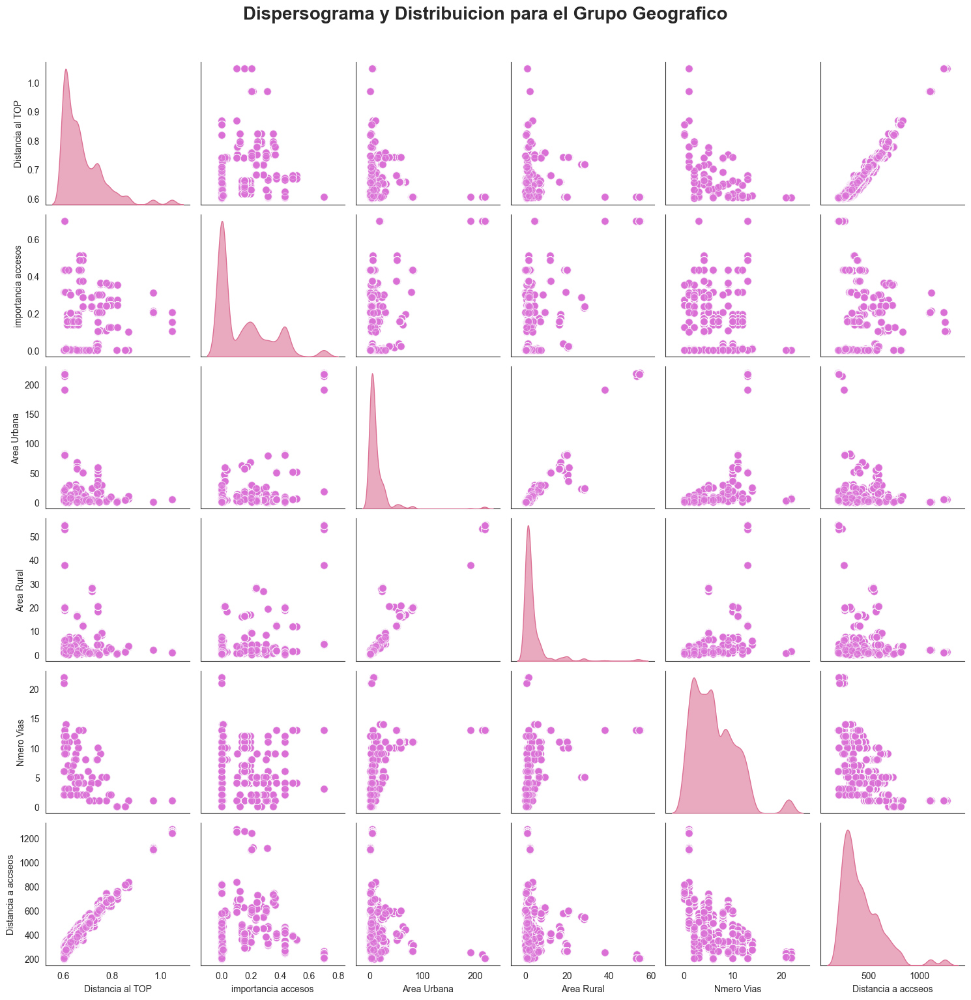

In [7]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Distancia a accseos']], diag_kind='kde', corner=False, plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el Grupo Geografico', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Descriptive Statistics for Economic Variables

In [8]:
variables = ['Pib Ponderado' ,'Inflacion' , 'Proxy Pobreza']

tabla_inical = Medidas_Centrales(base_final , 'Dolar')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

tabla_dispercion = Medidas_Dispersion(base_final , 'Dolar')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

tabla_forma = Medidas_Forma(base_final , 'Dolar')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)

In [9]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Dolar,3708.287417,3753.620000,2780.470000
1,Pib Ponderado,901.466779,297.587506,4.193204
2,Inflacion,6.435864,3.912850,1.506550
3,Proxy Pobreza,0.001936,0.001530,0.000036


In this case, we observe that the only variables whose means are noticeably skewed relative to their medians are **inflation** and **GDP**. This makes sense for two key reasons:

1. **Inflation Shocks:**  
   Occasional high-impact inflationary events—such as sudden currency devaluations or commodity price spikes—push average inflation above the typical monthly rate. These outlier months pull the mean upward, even though most months remain closer to the median.

2. **Regional GDP Concentration:**  
   Colombia’s economic output is heavily concentrated in a few major urban centers—Bogotá, Medellín, and Cali. These megacities produce a disproportionate share of national GDP, inflating the average at the country level, while the median city generates a much more modest share of output.

Understanding this skew is important because relying solely on the mean would overstate the “typical” experience of inflation or economic activity for most cities. In practice, using the **median** or specialized robust statistics will give a clearer picture of what most regions actually face, while still acknowledging the outsized influence of outlier events and large urban economies.  


In [10]:

tabla_dispercion 

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Dolar,3.423153e+05,585.077138,4914.525000,2780.470000,2134.055000
1,Pib Ponderado,9.817750e+06,3133.328919,39209.194186,4.193204,39205.000981
2,Inflacion,1.537843e+01,3.921534,13.344330,1.506550,11.837780
3,Proxy Pobreza,2.524640e-06,0.001589,0.017182,0.000036,0.017146


This analysis aligns with our earlier findings. Both **GDP** and **inflation** exhibit high dispersion—GDP because of the wide range of outputs across different cities, and inflation due to the post-pandemic economic rebound that drove rates as high as 11%. In contrast, our **poverty proxy** (GDP per capita) shows relatively little variation across regions, suggesting that income distribution remains fairly uniform outside the largest urban centers. Finally, the **exchange rate** also experienced significant volatility, peaking at COP 4,914 per USD, reflecting both global currency trends and domestic economic pressures.  


In [11]:

tabla_forma

,Variable,Asimetria,Kurtosis
0,Dolar,0.247991,2.102539
1,Pib Ponderado,8.269841,79.050679
2,Inflacion,0.544453,1.653343
3,Proxy Pobreza,3.457590,21.656089


Finally, when we examine skewness and kurtosis for **exchange rate** and **inflation**, we find they both exhibit only mild right skew and near-normal tail behavior—meaning extreme values are relatively rare. In contrast, **GDP** shows very heavy right tails: its high kurtosis indicates that while most cities’ outputs cluster around the mean, a small number of megacities (like Bogotá and Medellín) dominate the distribution with exceptionally large contributions.

Put simply, GDP’s distribution is “peaky” but has fat tails, reflecting the outsized economic weight of a few regions. Meanwhile, the exchange rate and inflation behave more like Gaussian variables in shape, suggesting that large, abrupt spikes or drops in those series are less common. Recognizing these differences is crucial for choosing the right statistical tools: robust methods (e.g., trimmed means or log-transforms) may be needed for GDP, whereas standard parametric models could suffice for inflation and currency fluctuations.  


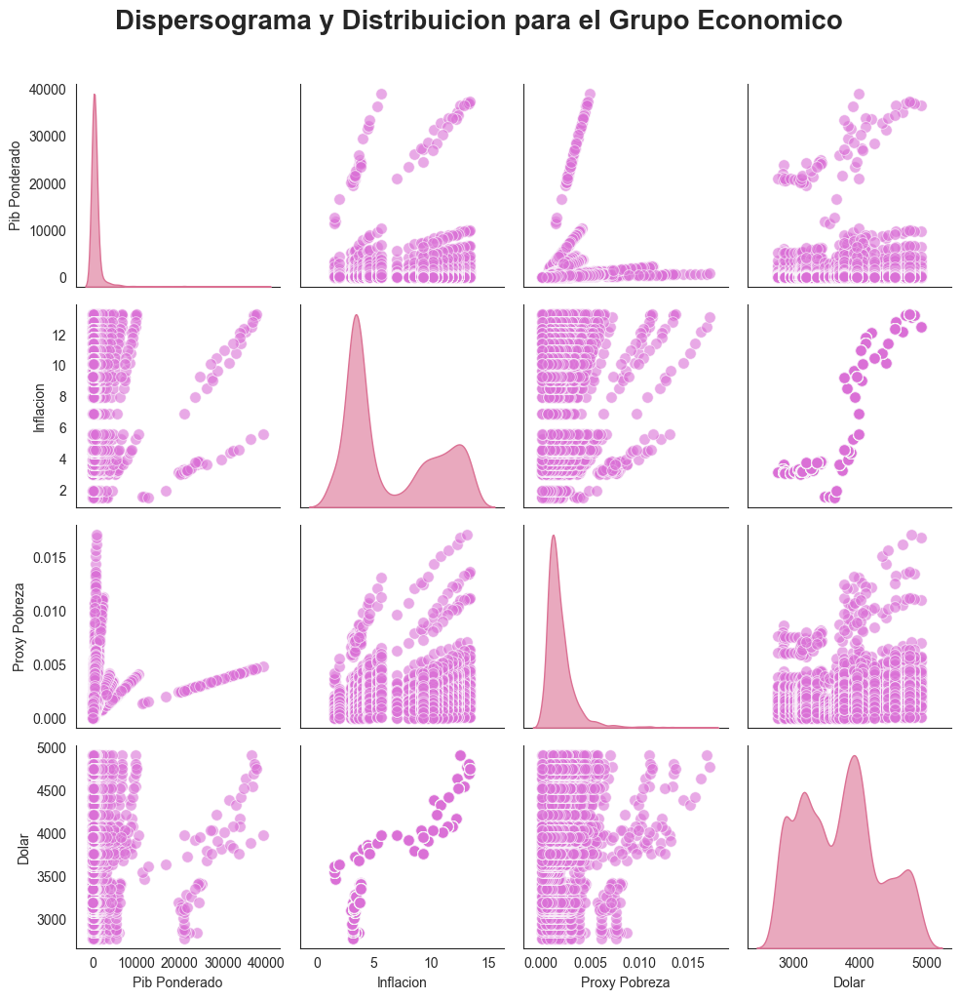

In [54]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Dolar']], diag_kind='kde', corner=False, plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el Grupo Economico', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Descriptive Statistics for Security Variables

In [45]:
variables = ['Hurtos' , 'Delitos Sexuales']

tabla_inical = Medidas_Centrales(base_final , 'Homicidios')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

tabla_dispercion = Medidas_Dispersion(base_final , 'Homicidios')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

tabla_forma = Medidas_Forma(base_final , 'Homicidios')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)

In [46]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Homicidios,7.569547,3.0,0
1,Hurtos,298.780041,66.0,5
2,Delitos Sexuales,22.987449,8.0,4


These three crime indicators are once again skewed by population size—larger cities naturally report more incidents simply because they have more residents. Interestingly, the mode for **homicides** is 0, suggesting that while homicides do occur, most city–month observations register none. Despite this, the mean homicide rate remains elevated by occasional spikes in high-population centers.

Overall, we see that **thefts** are by far the most common crime, followed by **sexual offenses**, and lastly **homicides**. All three distributions exhibit significant right skew, reflecting the influence of a few densely populated urban areas where crime rates concentrate. Recognizing this pattern is vital: when modeling or comparing crime data, it’s often preferable to use robust statistics—such as medians or percentile-based measures—to avoid letting extreme values from megacities distort our interpretation of “typical” crime levels.  


In [47]:

tabla_dispercion 

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Homicidios,2.321180e+02,15.235419,179,0,179
1,Hurtos,1.501658e+06,1225.421734,16095,0,16095
2,Delitos Sexuales,3.933001e+03,62.713642,885,0,885


The first thing that catches your attention is that the minimum value for all three crime metrics is zero. In other words, during some months in our study period, at least one city recorded no incidents of these crimes. Conversely, the standard deviations are extremely high relative to the means, indicating a prevalence of outliers. This pattern suggests that crime events tend to cluster in a small number of city–month observations, so using robust statistics (for example, medians or percentile-based measures) will give a clearer picture of typical crime levels.


In [48]:

tabla_forma

,Variable,Asimetria,Kurtosis
0,Homicidios,4.729259,29.149458
1,Hurtos,8.427788,79.713669
2,Delitos Sexuales,7.363918,65.887162


As we noted earlier, these crime variables exhibit the highest skewness of all groups we’ve analyzed, reflecting extremely heavy right tails. In practical terms, this means most city–month observations record typical crime counts, but a small number of instances show exceptionally high values. 

Moreover, their leptokurtic kurtosis indicates a sharp peak around the mean alongside those heavy tails—so although most data points cluster tightly near the average, the extreme outliers have a disproportionately large impact. Recognizing this distributional shape is essential: it guides us to use robust statistics (like medians or trimmed means) or apply data transformations when modeling, to prevent those few extreme cases from unduly skewing our results.  


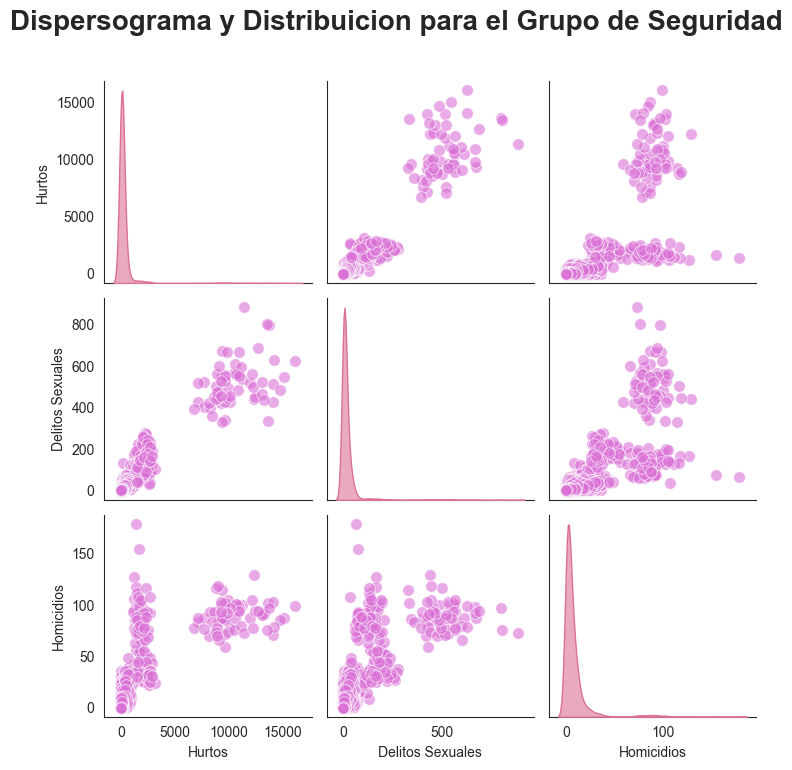

In [49]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Homicidios']], diag_kind='kde', corner=False, plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el Grupo de Seguridad', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Descriptive Statistics for Tourism Infrastructure Variables

In [20]:
variables = ['N Habitaciones' , 'N Camas' , 'Entradas Extranjeros Zona' ,'Eventos']

tabla_inical = Medidas_Centrales(base_final , 'Establecimientos de turismo')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

tabla_dispercion = Medidas_Dispersion(base_final , 'Establecimientos de turismo')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

tabla_forma = Medidas_Forma(base_final , 'Establecimientos de turismo')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)

In [21]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Establecimientos de turismo,53.501563,10.723376,6.0
1,N Habitaciones,46512.836799,94.692478,0.0
2,N Camas,633.251171,144.614232,0.0
3,Entradas Extranjeros Zona,12165.890947,522.000000,0.0
4,Eventos,0.910494,0.000000,0.0


For the accommodation infrastructure variables, we see that most cities have very few tourism or recreational establishments—the median is just 10. Likewise, the average number of rooms and beds is heavily skewed by a handful of large urban markets. For instance, the mean room count is 48,848, while the median is only 90, reflecting that major hubs host enormous hotels with thousands of rooms.

Interestingly, the bed count does not follow the same pattern: its distribution is less extreme than rooms. This suggests that outside of large properties, smaller operators or shared accommodations may offer many beds across fewer “rooms” (e.g., hostels or guesthouses), making beds a more accessible resource than full rooms in smaller destinations.

Finally, we observe that international arrivals concentrate in just a few zones. Some areas see a disproportionate share of foreign visitors—precisely the pattern we want our model to learn. By highlighting these “hot zones,” we can better predict where tourism-driven economic activity will be strongest.  


In [22]:

tabla_dispercion 

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Establecimientos de turismo,3.200344e+04,178.895050,4237.0,0.632799,4.236367e+03
1,N Habitaciones,3.522008e+11,593465.038530,20688742.0,0.000000,2.068874e+07
2,N Camas,8.147780e+06,2854.431697,141152.0,0.000000,1.411520e+05
3,Entradas Extranjeros Zona,7.084471e+08,26616.670124,190020.0,0.000000,1.900200e+05
4,Eventos,1.541989e+00,1.241768,6.0,0.000000,6.000000e+00


In our dispersion analysis, every variable shows a very large spread—with maximum values far exceeding the minima—highlighting the dramatic infrastructure gaps between different cities. This wide range reflects the heterogeneity in tourism and accommodation facilities, from major urban hubs to smaller destinations.  


In [23]:

tabla_forma

,Variable,Asimetria,Kurtosis
0,Establecimientos de turismo,10.192989,163.686487
1,N Habitaciones,18.411863,441.121261
2,N Camas,28.825470,1257.929387
3,Entradas Extranjeros Zona,3.998621,22.056927
4,Eventos,1.614760,5.641897


Here, the extremely high kurtosis indicates that most cities lack the capacity to host large numbers of visitors, while a few major urban centers can accommodate a disproportionate share. The strong positive skewness further confirms the presence of extreme outliers—those few cities with vast hotel and accommodation infrastructure drive the tail of the distribution.  

In practical terms, this means our model must account for two regimes:  
- **Typical Cities:** Small to mid-sized destinations with limited lodging capacity that behave homogeneously around low values.  
- **Mégaciudades:** Large hubs like Bogotá and Medellín that lie far out in the right tail, with exceptional capacity and tourism draw.  

Because of this “peaky” yet heavy-tailed distribution, relying on standard parametric assumptions could misrepresent the true variability. Instead, we should consider robust estimation techniques (e.g., log-transformations, percentile regressions, or mixture models) to capture both the bulk behavior of most cities and the outsized influence of the few large ones.  


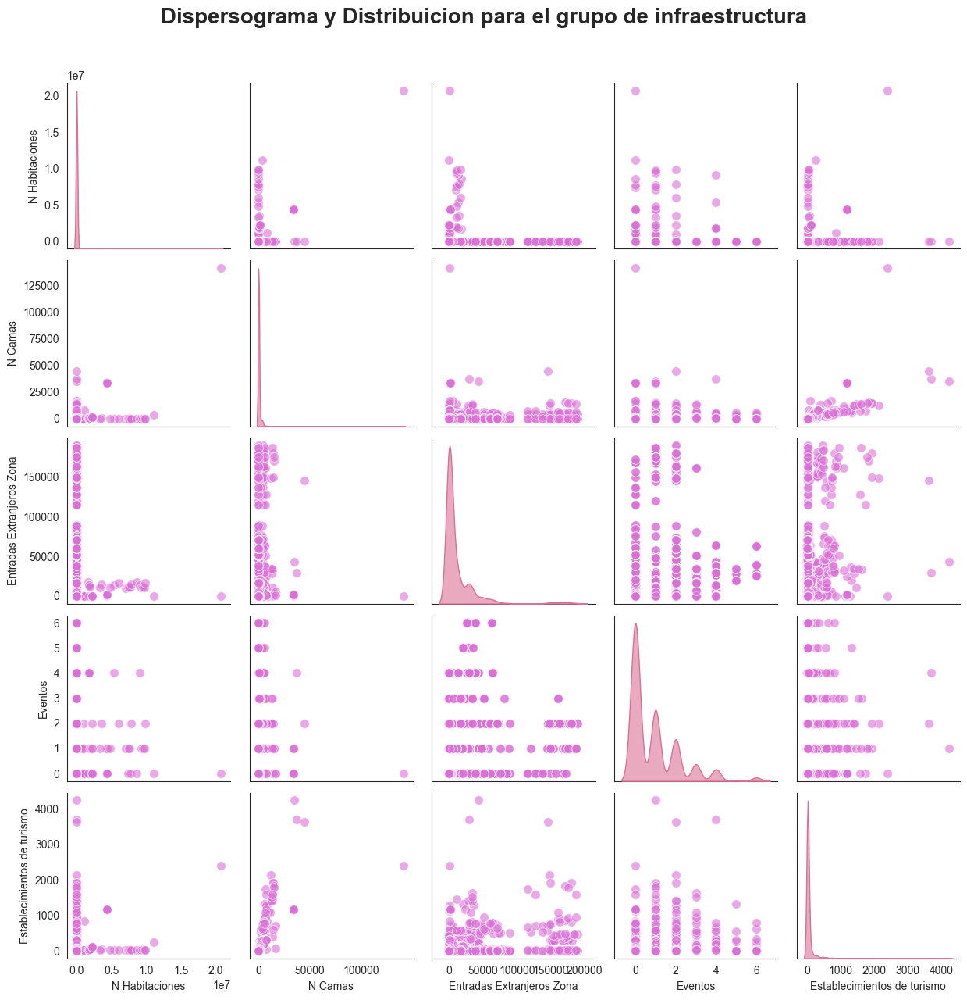

In [24]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Establecimientos de turismo']], diag_kind='kde', corner=False, plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el grupo de infraestructura', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Descriptive Statistics for Climate Variables

In [35]:
variables = ['Area Agua']

tabla_inical = Medidas_Centrales(base_final , 'Temperatura')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

tabla_dispercion = Medidas_Dispersion(base_final , 'Temperatura')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

tabla_forma = Medidas_Forma(base_final , 'Temperatura')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)

In [36]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Temperatura,21.646947,21.962231,22.334702
1,Area Agua,0.319252,0.023600,0.000000


In this case, we see that **temperature** exhibits no significant outliers—the mean and median are nearly identical—indicating that most Colombian cities experience a remarkably uniform climate, with slightly more locations on the warmer side of the spectrum. By contrast, **water area** shows pronounced outliers: coastal cities and those with large rivers or reservoirs register very high water-area values, while inland cities have almost none. This disparity arises naturally from geography—only a few cities border the ocean or major water bodies—so their satellite-derived water masks produce extreme values in km².

Overall, the stability of temperature across urban centers suggests it plays a relatively minor role in differentiating tourism potential, whereas water-area extremes highlight specific destinations (e.g., Cartagena, Santa Marta) that may attract visitors for aquatic activities. Recognizing these patterns allows our model to treat temperature as a baseline constant and to leverage water-area when predicting tourism hotspots linked to lakes, rivers, and coastlines.  


In [37]:

tabla_dispercion

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Temperatura,21.892882,4.678983,48.60000,0.0,48.60000
1,Area Agua,0.808108,0.898948,5.23858,0.0,5.23858


Although temperature spans a wide range, its standard deviation remains low—only a handful of cities have notably hotter microclimates, but most fall close to the average. In contrast, water-area variability is much higher: some municipalities border extensive coastal or riverine zones, driving up their water-area measurements, while inland cities register virtually no surface water. This contrast underscores that temperature is relatively uniform across our sample, whereas proximity to major water bodies creates stark differences in available aquatic landscapes.  


In [38]:

tabla_forma

,Variable,Asimetria,Kurtosis
0,Temperatura,-0.444847,4.287623
1,Area Agua,3.469821,14.707321


This analysis echoes our earlier findings: the **water-area** variable exhibits a heavy right tail—coastal and riparian cities drive extreme values—while **average temperature** has remained remarkably stable over the years. Both distributions are leptokurtic, indicating sharp peaks around the mean combined with fat tails. In practical terms, temperature provides a consistent baseline climate factor, whereas water-area highlights a small subset of destinations with significant aquatic landscapes that can strongly influence tourism patterns.  


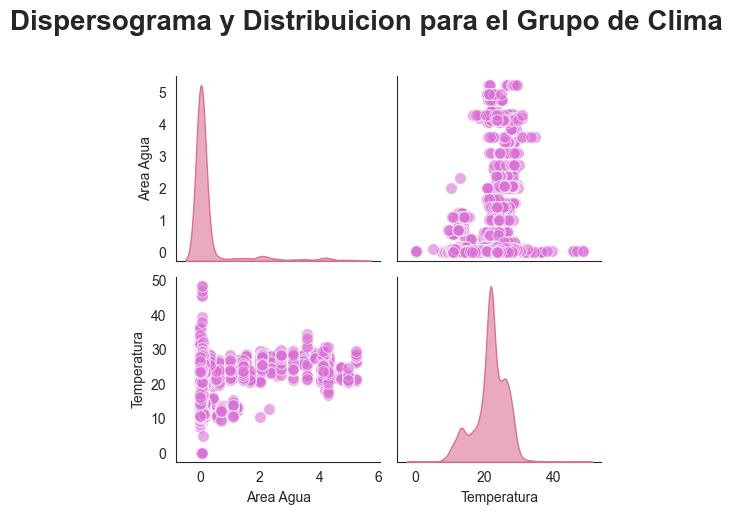

In [39]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Temperatura']], diag_kind='kde', corner=False, plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el Grupo de Clima', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Descriptive Statistics for Infrastructure Cost Variables

In [40]:
variables = ['Gasto Alojamiento Diario' , 'Gasto Transporte Diario' , 'Gasto alimetos Diario' , 'Otros Gastos Diario' , 'Gasto Promedio Viaje',
'Gasto  Alojamiento Viaje' , 'Gasto Transporte Viaje' , 'Gasto alimetos Viaje' , 'Otros Gastos Viaje'
]

tabla_inical = Medidas_Centrales(base_final , 'Gasto Promedio Diario')
for i in variables:
    tabla = Medidas_Centrales(base_final , i)
    tabla_inical = pd.concat([tabla_inical, tabla], ignore_index=True)

tabla_dispercion = Medidas_Dispersion(base_final , 'Gasto Promedio Diario')
for i in variables:
    tabla = Medidas_Dispersion(base_final , i)
    tabla_dispercion = pd.concat([tabla_dispercion, tabla], ignore_index=True)

tabla_forma = Medidas_Forma(base_final , 'Gasto Promedio Diario')
for i in variables:
    tabla = Medidas_Forma(base_final , i)
    tabla_forma = pd.concat([tabla_forma, tabla], ignore_index=True)

In [41]:

tabla_inical

,Variable,Media,Mediana,Moda
0,Gasto Promedio Diario,87939.414464,82133.680000,66575.110188
1,Gasto Alojamiento Diario,15265.889578,14922.329989,19593.295468
2,Gasto Transporte Diario,16651.227454,17057.070750,17057.070750
3,Gasto alimetos Diario,24083.896974,23347.940118,29685.681284
4,Otros Gastos Diario,32045.428782,27702.183895,7517.886000
5,Gasto Promedio Viaje,442151.802000,420958.863710,184121.388247
6,Gasto Alojamiento Viaje,76372.340005,73761.426296,96724.213292
7,Gasto Transporte Viaje,82242.230880,80104.388875,10138.970000
8,Gasto alimetos Viaje,117721.176376,121556.450000,135766.831250
9,Otros Gastos Viaje,161884.757519,144899.954919,38091.730000


These expenditure variables exhibit few extreme outliers—notice that the mean remains close to the median, indicating a relatively balanced distribution. When we look at spending patterns, tourists typically allocate an average of **COP 87,939 per day** and **COP 442,151 over the entire trip**. The largest share of this budget goes toward **food and beverages** (about **COP 24,083 daily** and **COP 117,721 per trip**), while the remainder covers **miscellaneous expenses**—such as souvenirs, leisure activities, and other discretionary purchases.  

By capturing both the stability of average spending and the breakdown of cost categories, we can more accurately model revenue flows and predict how different cities might benefit from tourism-driven consumption.  


In [42]:


tabla_dispercion

,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango
0,Gasto Promedio Diario,5.963870e+08,24421.035601,193060.401,41692.060000,1.513683e+05
1,Gasto Alojamiento Diario,3.797548e+07,6162.425226,62717.358,997.409627,6.171995e+04
2,Gasto Transporte Diario,1.540128e+07,3924.446806,31415.664,1404.365000,3.001130e+04
3,Gasto alimetos Diario,4.986993e+07,7061.864792,49172.559,8881.306238,4.029125e+04
4,Otros Gastos Diario,1.644215e+08,12822.694515,135617.006,7517.886000,1.280991e+05
5,Gasto Promedio Viaje,2.055066e+10,143355.015533,1460386.480,184121.388247,1.276265e+06
6,Gasto Alojamiento Viaje,1.329094e+09,36456.742029,474419.310,8737.270443,4.656820e+05
7,Gasto Transporte Viaje,4.819842e+08,21954.137863,169886.650,10138.970000,1.597477e+05
8,Gasto alimetos Viaje,1.038196e+09,32221.046514,267759.030,50765.191871,2.169938e+05
9,Otros Gastos Viaje,6.769454e+09,82276.689977,979101.784,38091.730000,9.410101e+05


With this table, we can see that some regions incur significantly higher total-trip costs, while others remain much more affordable. Although the standard deviation for most spending categories is relatively moderate—indicating consistent daily and trip-level budgets—the “Miscellaneous” and “Average Daily Expenditure” metrics exhibit much larger variability. This tells us that discretionary expenses (like entertainment, souvenirs, and other non-essentials) can swing widely depending on the destination. In practice, a traveler’s overall trip cost may be driven more by these unpredictable “other” expenses than by core costs like lodging and food. Understanding which cities tend to generate higher “miscellaneous” spending will help us refine our revenue forecasts and tailor marketing strategies to those locations where tourists are more likely to splurge.  


In [43]:


tabla_forma

,Variable,Asimetria,Kurtosis
0,Gasto Promedio Diario,0.733730,3.409451
1,Gasto Alojamiento Diario,1.844595,13.241222
2,Gasto Transporte Diario,0.265479,4.591640
3,Gasto alimetos Diario,0.661056,3.283410
4,Otros Gastos Diario,2.527302,16.674313
5,Gasto Promedio Viaje,1.956050,12.220686
6,Gasto Alojamiento Viaje,4.126610,40.290415
7,Gasto Transporte Viaje,0.694850,4.673241
8,Gasto alimetos Viaje,0.561262,3.640574
9,Otros Gastos Viaje,3.978938,32.634017


Here we see that most spending variables exhibit only mild skewness, indicating relatively few extreme outliers—except for **Accommodation Trip Expenditure** and **Other Trip Expenses**, which show pronounced right tails. Their high kurtosis confirms that, while most travelers spend near the average, a smaller group engages in unusually large expenditures on lodging and discretionary items.  

From this, we can conclude that accommodation costs vary dramatically by city—major urban centers and popular destinations command premium hotel rates—while spending on entertainment, souvenirs, and other non-essential trip elements also differs substantially across locations. By modeling these two high-variability categories carefully, we can better predict revenue potential and tailor tourism strategies to the cities where visitors are most likely to splurge.  


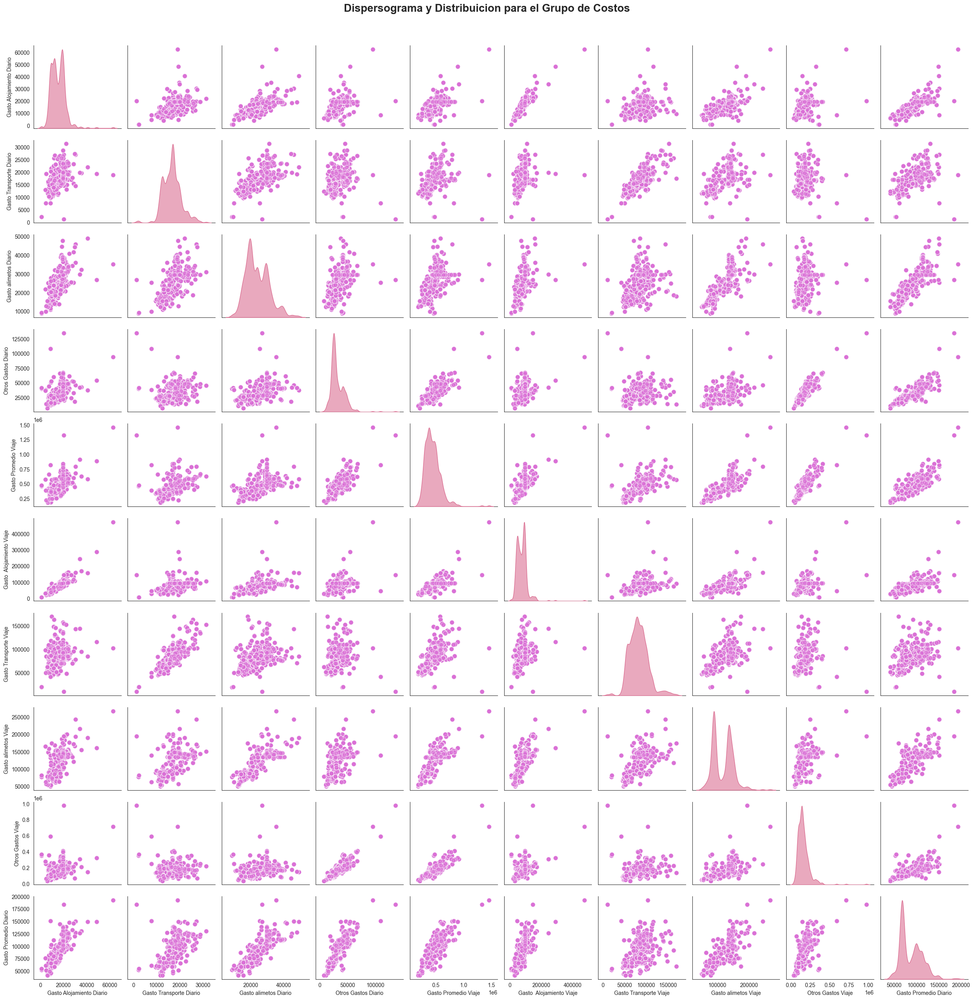

In [44]:
with sns.axes_style("white"):
    pairplot = sns.pairplot(base_final[variables + ['Gasto Promedio Diario']], diag_kind='kde', corner=False,plot_kws={'alpha':0.6 ,'color': '#DA70D6' ,'s': 70} ,
    diag_kws={'color': '#DB7093','fill': True, 'alpha': 0.6 })
    pairplot.fig.suptitle('Dispersograma y Distribuicion para el Grupo de Costos', fontsize=20, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.grid(False)
    plt.show()

## Dependent Variable Analysis = Number of Foreigners

In [12]:
tabla_inical = Medidas_Centrales(base_final , 'Nmero Extranjeros')
tabla_dispercion = Medidas_Dispersion(base_final , 'Nmero Extranjeros')
tabla_forma = Medidas_Forma(base_final , 'Nmero Extranjeros')


pd.concat([tabla_inical, tabla_dispercion, tabla_forma], axis=1)


,Variable,Media,Mediana,Moda,Variable,Varianza,Desviacion Estandar,Maximo,Minimo,Rango,Variable,Asimetria,Kurtosis
0,Nmero Extranjeros,2859.065638,91.0,1.0,Nmero Extranjeros,1.805250e+08,13435.960674,152457.0,0.0,152457.0,Nmero Extranjeros,6.861403,55.005053


We observe numerous outliers in our dependent variable—monthly tourist arrivals. This disparity arises because tourism flows in major hubs like Bogotá, Medellín, and Cartagena dwarf those of smaller municipalities such as Pitalito or Mitú. As a result, the overall range is vast, the kurtosis is extremely high, and the distribution has very heavy right‐hand tails. These features suggest that standard statistical models could be skewed by a few large values; to capture meaningful insights across all cities, we should consider robust estimation techniques (e.g., median‐based measures or log transformations) that mitigate the influence of extreme observations.  


## Correlation graph

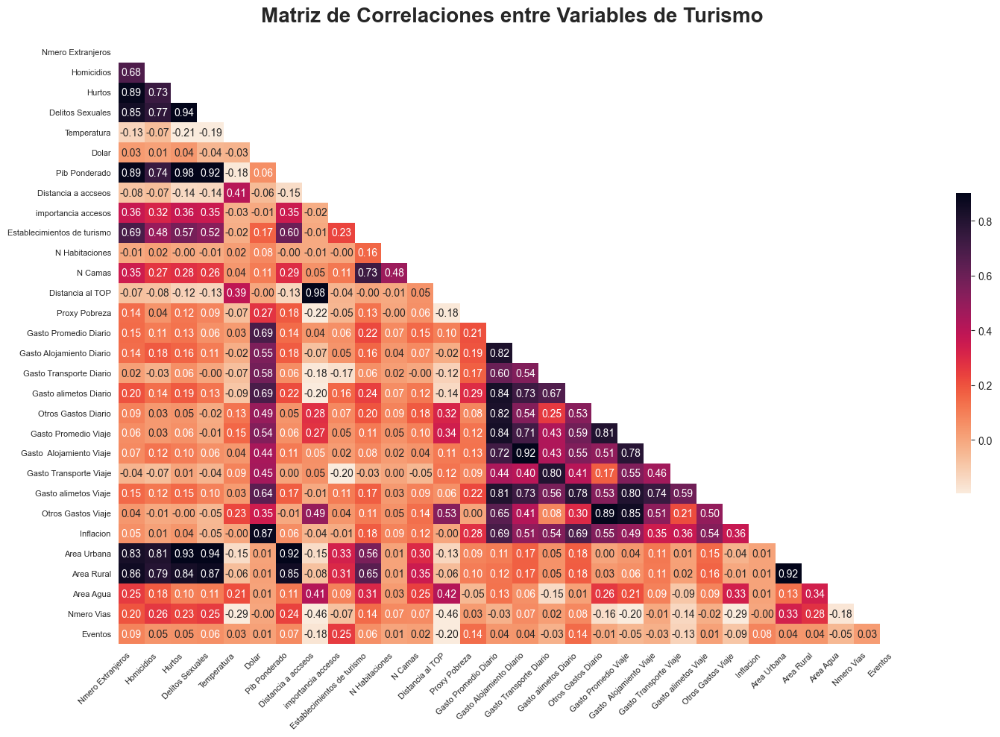

In [50]:

import seaborn as sns

Base_Turismo_PD2 = base_final[['Nmero Extranjeros', 'Homicidios', 'Hurtos',
       'Delitos Sexuales', 'Temperatura', 'Dolar',
       'Pib Ponderado', 'Distancia a accseos','importancia accesos',
       'Establecimientos de turismo', 'N Habitaciones', 'N Camas', 'Distancia al TOP',
       'Proxy Pobreza', 'Gasto Promedio Diario', 'Gasto Alojamiento Diario',
       'Gasto Transporte Diario', 'Gasto alimetos Diario',
       'Otros Gastos Diario', 'Gasto Promedio Viaje',
       'Gasto  Alojamiento Viaje', 'Gasto Transporte Viaje',
       'Gasto alimetos Viaje', 'Otros Gastos Viaje' , 'Inflacion' , 'Area Urbana' , 'Area Rural' , 'Area Agua' ,'Nmero Vias' ,'Eventos']]

correlation_matrix = Base_Turismo_PD2.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
with sns.axes_style("white"):
    with sns.plotting_context(font_scale=0.8):
        plt.figure(figsize=(15, 10))
        sns.heatmap(correlation_matrix, mask=mask, cmap='rocket_r' , annot=True, fmt=".2f", robust=True, linecolor='white',
            cbar_kws={"shrink": .5, "ticks": np.linspace(-1, 1, 11)},)
        plt.title('Matriz de Correlaciones entre Variables de Turismo', fontsize=20, weight='bold', pad=20)
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(rotation=0, fontsize=8)
        plt.tight_layout()
        plt.show()

### The correlation matrix clearly shows that tourism in Colombia is driven by infrastructure, economic development, and connectivity. Variables such as the number of beds and tourism establishments exhibit a strong positive correlation with foreign visitor arrivals. Similarly, weighted GDP correlates positively with both visitor volume and their spending power—especially on accommodation.

While crime indicators (thefts, homicides, and sexual offenses) display only moderate correlations with tourist numbers, they do not appear to constitute a major barrier to tourism. Urban area also shows a positive relationship with visitor flows, underscoring the appeal of city destinations. In contrast, rural and water-area metrics have weaker direct links to tourism, suggesting that natural and agricultural landscapes play a secondary role in attracting international travelers.

Taken together, these insights highlight several strategic priorities:
- **Invest in Infrastructure & Connectivity:** Expanding hotel capacity and improving transport links (airports, roads, rail) will amplify tourism growth.  
- **Leverage Economic Hubs:** Bolster urban destinations, where economic activity and visitor spending are highest, while using their success to fuel development elsewhere.  
- **Promote Balanced Regional Development:** Address disparities between urban and rural areas by channeling tourism investment into under-served regions, creating new attractions and amenities outside the major cities.  
- **Maintain Safety as a Complementary Asset:** Continue strengthening public security—while not the primary inhibitor, ensuring safe environments enhances overall tourist confidence and satisfaction.

By aligning policy and investment with these findings, Colombia can sustainably scale its tourism sector, spread economic benefits more evenly, and reinforce its position as a world-class destination.  


## Graph of the dependent variable

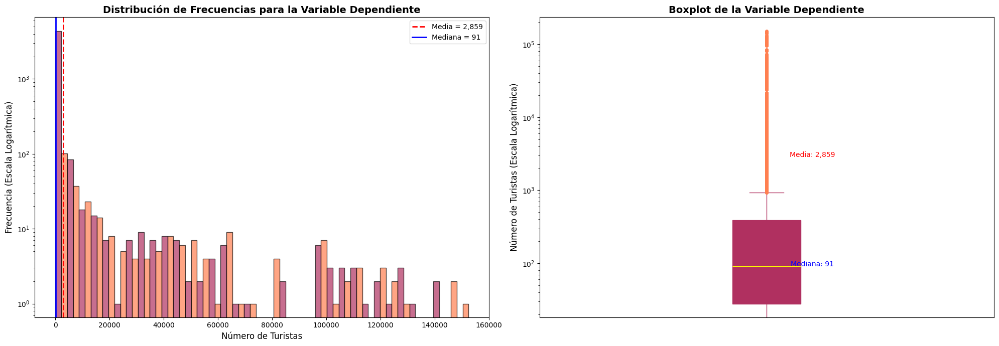

In [15]:
import matplotlib.pyplot as plt

frecuencia_categorias = base_final['Nmero Extranjeros']
media_variable1 = base_final['Nmero Extranjeros'].mean()
mediana_variable1 = base_final['Nmero Extranjeros'].median()
color = ['#B03060', '#FF7F50']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))

ax1 = axes[0]
n, bins, patches = ax1.hist(frecuencia_categorias, bins=math.ceil(math.sqrt(len(base_final['Nmero Extranjeros']))), alpha=0.7,edgecolor='black') # Usamos para el numero de BINS sqrt(x) 
for i, patch in enumerate(patches):
    patch.set_facecolor(color[i % len(color)])
ax1.axvline(x=media_variable1, color='red', linestyle='dashed', linewidth=2, label=f'Media = {media_variable1:,.0f}')
ax1.axvline(x=mediana_variable1, color='blue', linestyle='-', linewidth=2, label=f'Mediana = {mediana_variable1:,.0f}')
ax1.legend()
ax1.set_yscale('log') #Aplicamos logaritmo al eje y para que todos los bins se puedan ver
ax1.set_title('Distribución de Frecuencias para la Variable Dependiente', fontsize=14, weight='bold')
ax1.set_xlabel('Número de Turistas', fontsize=12)
ax1.set_ylabel('Frecuencia (Escala Logarítmica)', fontsize=12)

ax2 = axes[1]
box = ax2.boxplot(frecuencia_categorias, vert=True, patch_artist=True,boxprops=dict(facecolor='#B03060', color='#B03060'),medianprops=dict(color='yellow'),
    whiskerprops=dict(color='#B03060'),capprops=dict(color='#B03060'),flierprops=dict(marker='o', markerfacecolor='#FF7F50', markersize=5, linestyle='none', markeredgecolor='none'))
ax2.set_title('Boxplot de la Variable Dependiente', fontsize=14, weight='bold')
ax2.set_ylabel('Número de Turistas (Escala Logarítmica)', fontsize=12)
ax2.text(1.1, media_variable1, f'Media: {media_variable1:,.0f}', horizontalalignment='center', color='red', fontsize=10)
ax2.text(1.1, mediana_variable1, f'Mediana: {mediana_variable1:,.0f}', horizontalalignment='center', color='blue', fontsize=10)
ax2.set_xticks([])
ax2.set_yscale('log')


plt.tight_layout()
plt.show()  

### The dependent variable’s distribution is heavily skewed toward low values, with a small number of cities registering exceptionally high tourist counts that inflate the mean. This pattern indicates that our predictive model must handle extreme observations carefully—options include applying a log transformation to the tourist count or using robust error metrics that reduce the influence of outliers. Additionally, it will be important to segment cities by their level of tourist attraction (e.g., major hubs versus secondary destinations) to ensure that extreme values from top-performing locations do not distort predictions for less-visited cities.


# Useful graphics to analyze the entire data structure

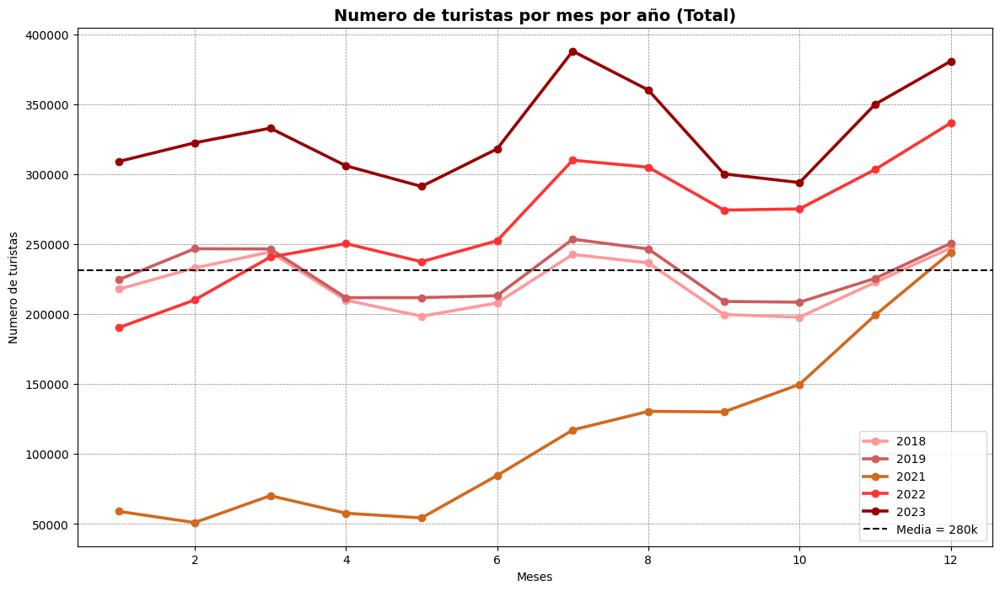

In [171]:

data ={}
df = pd.DataFrame(data)
df['año'] = base_final['Mes'].dt.year
df['mes'] = base_final['Mes'].dt.month
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

df = df.groupby(['año', 'mes'])['Nmero Extranjeros'].sum().reset_index()
media_variable1 = df['Nmero Extranjeros'].mean()
meses_2018 = np.arange(1, 13) 

plt.figure(figsize=(14, 8))    
plt.plot(meses_2018, df[df['año']==2018]['Nmero Extranjeros'] ,label="2018", 
         linewidth=2.6 , color='#FF9999', marker='o')
plt.plot(meses_2018, df[df['año']==2019]['Nmero Extranjeros'] ,label="2019", 
         linewidth=2.6 , color='#CD5C5C', marker='o')
plt.plot(meses_2018, df[df['año']==2021]['Nmero Extranjeros'] ,label="2021", 
         linewidth=2.6 , color='#D2691E', marker='o')
plt.plot(meses_2018, df[df['año']==2022]['Nmero Extranjeros'] ,label="2022", 
         linewidth=2.6 , color='#FF3333', marker='o')
plt.plot(meses_2018, df[df['año']==2023]['Nmero Extranjeros'] ,label="2023", 
         linewidth=2.6 , color='#990000', marker='o')
plt.axhline(media_variable1, color='Black', linestyle='--', label='Media = 280k ')
plt.xlabel('Meses')
plt.ylabel('Numero de turistas')
plt.title('Numero de turistas por mes por año (Total)', fontsize=14, weight='bold')
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.legend()
plt.show()

### The chart shows the monthly trend in total tourist arrivals to Colombia from 2018 through 2023, highlighting clear seasonality and evolving growth patterns. Two peak seasons stand out: mid-year (June–August) and year-end (November–December), with July and January consistently posting the highest visitor numbers. In contrast, April and September are typically low points, suggesting off-peak periods that could benefit from targeted promotion.

### Exogenous shocks—most notably the COVID-19 pandemic—are vividly reflected in the data. Tourist volumes plunged in 2020 and only began to recover in 2021, remaining below pre-pandemic levels seen in 2018 and 2019. From 2022 onward, and especially throughout 2023, we observe a sustained rebound: key months like July and December regularly exceed 350,000 arrivals, signaling a robust economic recovery fueled by improved connectivity, strategic marketing campaigns, and shifting traveler preferences.

### Although the overall average monthly arrival figure hovers around 280,000, 2023’s performance far outstrips this benchmark, underscoring its status as an exceptional year for tourism. These dynamics underscore the need for forecasting models to incorporate both seasonal cycles and structural breaks (e.g., pandemic impacts). They also highlight the importance of capacity planning—ensuring sufficient infrastructure and logistics during peak months—and of deploying tailored promotional efforts during slower periods to smooth demand and maximize Colombia’s tourism potential.  


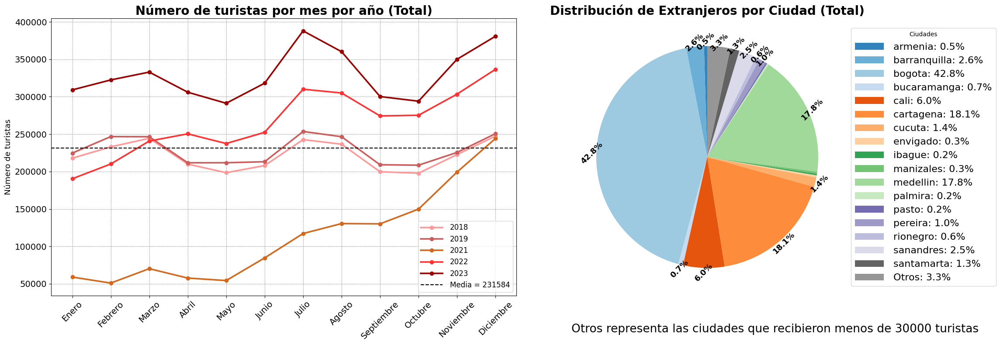

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#%% Preparación de los datos para la gráfica de líneas

# Se supone que base_final ya está definido y contiene las columnas 'Mes' (de tipo datetime o convertible) y 'Nmero Extranjeros'
data = {}
df_line = pd.DataFrame(data)
df_line['año'] = base_final['Mes'].dt.year
df_line['mes'] = base_final['Mes'].dt.month
df_line['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

# Agrupamos por año y mes
df_line = df_line.groupby(['año', 'mes'])['Nmero Extranjeros'].sum().reset_index()
media_variable = df_line['Nmero Extranjeros'].mean()
meses = np.arange(1, 13)

#%% Preparación de los datos para el gráfico de pastel (sin filtrar por año)

df_pie = pd.DataFrame(data)
# Convertimos la columna 'Mes' a datetime si no lo está ya
df_pie['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df_pie['año'] = df_pie['fecha'].dt.year
df_pie['mes'] = df_pie['fecha'].dt.month
df_pie['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df_pie['Ciudad'] = base_final['Ciudad']

# Agrupamos la suma total de turistas por ciudad (sin filtrar)
ciudades_total = df_pie.groupby('Ciudad')['Nmero Extranjeros'].sum()
umbral = 30000
ciudades_agrupadas = ciudades_total[ciudades_total >= umbral]
otros = ciudades_total[ciudades_total < umbral].sum()
# Agregamos la categoría "Otros"
ciudades_agrupadas['Otros'] = otros

#%% Creación de la figura con dos paneles

fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Panel Izquierdo: Gráfica de líneas
ax1 = axes[0]

# Diccionario con los colores asignados a cada año según el original
colores = {
    2018: "#FF9999",
    2019: "#CD5C5C",
    2021: "#D2691E",
    2022: "#FF3333",
    2023: "#990000"
}


# Se itera sobre los años disponibles y se usa el color correspondiente
for year in sorted(df_line['año'].unique()):
    ax1.plot(meses, df_line[df_line['año'] == year]['Nmero Extranjeros'], 
             label=str(year), linewidth=2.6, marker='o', color=colores.get(year, None))

ax1.axhline(media_variable, color='black', linestyle='--', label=f'Media = {media_variable:.0f}')
ax1.set_ylabel('Número de turistas' ,  fontsize=13)
ax1.set_title('Número de turistas por mes por año (Total)',  fontsize=20, fontweight='bold')
ax1.grid(True, color='gray', linestyle='--', linewidth=0.5)
ax1.legend()
ax1.set_xticks(range(1, 13))
meses_etiquetas = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
                   'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
ax1.set_xticklabels(meses_etiquetas ,  fontsize=14 , rotation=45)
ax1.tick_params(axis='y', labelsize=14)
# Panel Derecho: Gráfico de pastel unificado (sin filtrar por año)
ax2 = axes[1]
colores = plt.get_cmap('tab20c')(range(len(ciudades_agrupadas)))
wedges, texts, autotexts = ax2.pie(ciudades_agrupadas, startangle=90, colors=colores, autopct='')

# Cálculo de porcentajes para cada categoría
porcentajes = [(ciudad, (valor/ciudades_agrupadas.sum())*100) 
               for ciudad, valor in zip(ciudades_agrupadas.index, ciudades_agrupadas)]
for wedge, (ciudad, porcentaje) in zip(wedges, porcentajes):
    if porcentaje > 0.4:
        angle = (wedge.theta2 + wedge.theta1) / 2
        x = np.cos(np.deg2rad(angle)) * 1.04
        y = np.sin(np.deg2rad(angle)) * 1.04
        ax2.text(x, y, f'{porcentaje:.1f}%', ha='center', va='center', fontsize=13, weight='bold' , rotation=45)
ax1.legend(loc='lower right' , fontsize=12, handlelength=3, handletextpad=1)

ax2.set_title('Distribución de Extranjeros por Ciudad (Total)', fontsize=20, fontweight='bold')
porcentajes_texto = [f'{ciudad}: {porcentaje:.1f}%' for ciudad, porcentaje in porcentajes]
ax2.legend(wedges, porcentajes_texto, title="Ciudades", loc="center left", bbox_to_anchor=(1, 0.5) , fontsize=16, handlelength=3, handletextpad=1)
ax2.text(0.01, -0.1, 'Otros representa las ciudades que recibieron menos de 30000 turistas', 
         transform=ax2.transAxes, fontsize=19, ha='left', va='top')

plt.tight_layout()
plt.show()


## Interpretation of the Tourism Trends and City Distribution Charts

### 1. Monthly Tourist Arrivals by Year (2018–2023)
- **Strong Seasonality:**  
  - Two clear peak periods emerge every year—**mid-year (June–August)** and **year-end (November–December)**—with **July** and **January** often registering the highest monthly totals.  
  - **Off-peak dips** typically occur in **April** and **September**, suggesting targeted promotional opportunities during those downturns.

- **Pandemic Impact & Recovery Trajectory:**  
  - **2021** (orange line) marks the lowest point in our series, with monthly arrivals hovering between 50,000 and 130,000 as international travel remained constrained.  
  - **2022** (red line) shows a solid rebound—monthly figures climb into the 200,000–250,000 range, reflecting initial recovery efforts post-COVID.  
  - **2023** (dark red line) outperforms all previous years, peaking at nearly **390,000** in July and December and consistently exceeding the overall average of **231,584** tourists (dashed line). This suggests a robust resurgence driven by pent-up demand, improved connectivity, and successful marketing campaigns.

- **Year-Over-Year Growth:**  
  - Comparing the trajectories, each successive year from 2021 to 2023 not only recovers lost ground but surpasses prior levels, indicating **accelerating growth** rather than a simple return to pre-pandemic norms.

### 2. Distribution of Foreign Tourists by City
- **High Concentration in Major Hubs:**  
  - **Bogotá** dominates with **42.8%** of all foreign arrivals, followed by **Cartagena (18.1%)** and **Medellín (17.8%)**.  
  - These three cities alone account for **78.7%** of inbound tourism, underscoring their critical role in Colombia’s international appeal.

- **Secondary Destinations:**  
  - **Cali** holds **6.0%**, while **Barranquilla (2.6%)** and **San Andrés (2.5%)** also attract meaningful shares.  
  - A small group of mid-sized cities (e.g., **Bucaramanga**, **Cúcuta**, **Pereira**, **Pasto**) each contribute around **0.2%–1.4%**, indicating niche or emerging markets.

- **“Long Tail” of Smaller Cities:**  
  - The **“Others”** category (cities with fewer than 30,000 arrivals) still comprises **3.3%** collectively, revealing that a scattered network of smaller destinations captures a non-negligible slice of tourism.

### 3. Strategic Insights
1. **Focus Investment on Core Hubs:**  
   - Given that Bogotá, Cartagena, and Medellín draw nearly 80% of visitors, expanding capacity and services in these cities will yield the highest immediate returns.

2. **Develop Emerging Markets:**  
   - Mid-sized destinations like Cali, Barranquilla, and San Andrés show growth potential; targeted infrastructure upgrades and marketing can lift them into the next tier.

3. **Smooth Seasonality:**  
   - Promotional efforts and special events in **April** and **September** could help balance demand, reducing off-peak volatility.

4. **Leverage the Long Tail:**  
   - Although individually small, the collective “Others” segment represents an opportunity to diversify tourism flows—investing in regional attractions can unlock incremental gains and foster more balanced regional development.

By combining these temporal and geographic insights, stakeholders can optimize resource allocation, tailor marketing strategies, and build a more resilient, inclusive tourism ecosystem across Colombia.


C:\Users\alejo\AppData\Local\Temp\ipykernel_22364\3581834853.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=Extr_dep['Nmero Extranjeros'], y=Extr_dep.index, palette='viridis', ax=axes[1])


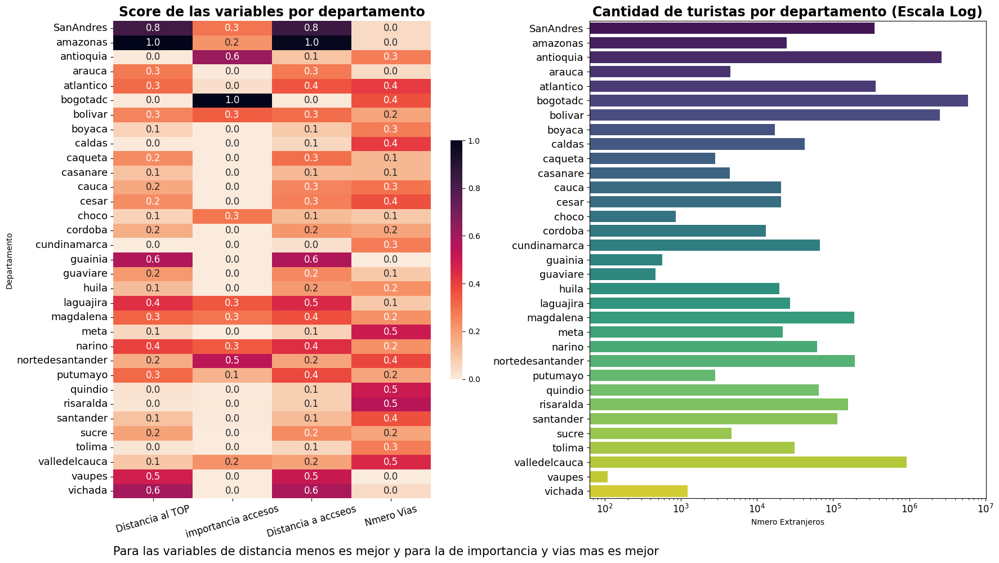

In [42]:
from sklearn.preprocessing import MinMaxScaler

data={}
df = pd.DataFrame(data)
df['Distancia al TOP'] = base_final['Distancia al TOP']
df['importancia accesos'] = base_final['importancia accesos']
df['Distancia a accseos'] = base_final['Distancia a accseos']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df['Nmero Vias'] = base_final['Nmero Vias']

scaler = MinMaxScaler()
df_normalizado = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df_normalizado['Departamento'] = base_final['Departamento']
df_normalizado['Departamento'] = df_normalizado['Departamento'].str.replace('archipielagodesanandresprovidenciaysantacatalina', 'SanAndres', regex=False)
base_final['Departamento'] = base_final['Departamento'].str.replace('archipielagodesanandresprovidenciaysantacatalina', 'SanAndres', regex=False)

Extr_dep= base_final.groupby('Departamento')[['Nmero Extranjeros'  ,'Temperatura']].sum()
crime_data = df_normalizado.groupby('Departamento')[['Distancia al TOP', 'importancia accesos', 'Distancia a accseos' , 'Nmero Vias']].median()

fig, axes = plt.subplots(1, 2, figsize=(20, 11))
sns.heatmap(crime_data, annot=True, fmt=".1f", cmap='rocket_r', ax=axes[0] ,cbar_kws={"shrink": .5, "ticks": np.linspace(-1, 1, 11)} ,
            annot_kws={"fontsize": 12})
axes[0].text(0.0001, -0.1, 'Para las variables de distancia menos es mejor y para la de importancia y vias mas es mejor', transform=axes[0].transAxes, fontsize=15, ha='left', va='top')
axes[0].set_title('Score de las variables por departamento' , fontsize=17, fontweight='bold')
axes[0].tick_params(axis='x', rotation=16, labelsize=12)

sns.barplot(x=Extr_dep['Nmero Extranjeros'], y=Extr_dep.index, palette='viridis', ax=axes[1])
axes[1].set_title('Cantidad de turistas por departamento (Escala Log)' , fontsize=17, fontweight='bold')
axes[1].set_xscale('log')
axes[0].tick_params(axis='y', labelsize=13) 
axes[1].tick_params(axis='y', labelsize=13)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].set_ylabel("")
plt.show()

### Departmental Access & Connectivity Scores (Heatmap)

The heatmap displays four normalized metrics for each department’s international access points:

- **Distance to Top Destinations** (lower is better)  
- **Access Importance** (higher is better)  
- **Distance to Access Points** (lower is better)  
- **Number of Major Roads** (higher is better)  

Key takeaways:  
- **San Andrés**, **Amazonas**, and **Guainía** rank highest in “Access Importance,” reflecting their strategic gateway status despite remote locations.  
- **Antioquia** and **Cundinamarca** (including Bogotá) score very well on road connectivity and proximity, underscoring their dense transport networks.  
- **Vaupés** and **Vichada** sit at the bottom across nearly every dimension, highlighting minimal infrastructure and significant barriers to tourism access.

This contrast reveals clear infrastructure gaps: departments with strong road networks and close proximity to major air or border crossings enjoy a pronounced advantage in attracting international visitors, while remote regions remain under-served.

---

### Foreign Tourist Arrivals by Department (Log-Scale Bar Chart)

The bar chart, plotted on a logarithmic scale, shows total foreign arrivals for each department:

- **Cundinamarca** (dominated by Bogotá) and **Antioquia** lead by a wide margin, reflecting their status as Colombia’s primary economic and cultural hubs.  
- Coastal departments—**Atlántico**, **Bolívar**, and **Magdalena**—follow closely, underlining the strength of beach and maritime tourism.  
- Departments with poor connectivity scores (e.g., **Vaupés**, **Vichada**, **Guaviare**) register the lowest arrival figures, confirming that limited infrastructure translates into low tourist volumes.  
- **San Andrés** stands out as an island exception: despite geographic isolation, its high “Access Importance” and well-developed air links propel it well above most interior departments.

---

### Strategic Insights

1. **Infrastructure Drives Tourism**  
   Regional disparities in roads and airport connectivity directly map to visitor numbers. Improving transport links in low-scoring departments could unlock new tourism potential.

2. **Concentration vs. Opportunity**  
   While Bogotá and Medellín capture the lion’s share of inbound travel, secondary and coastal hubs (e.g., Barranquilla, Santa Marta) represent growth opportunities with targeted investments.

3. **Island Exception**  
   San Andrés demonstrates that even remote locations can succeed if air connectivity is prioritized. Similar strategies—such as subsidized routes or improved terminals—could benefit other remote departments.

4. **Balanced Development**  
   A data-driven model should incorporate these access metrics to predict tourism flows. Policymakers can then allocate resources—road upgrades, airport expansions, marketing—to under-connected regions and foster a more equitable tourism economy across Colombia.


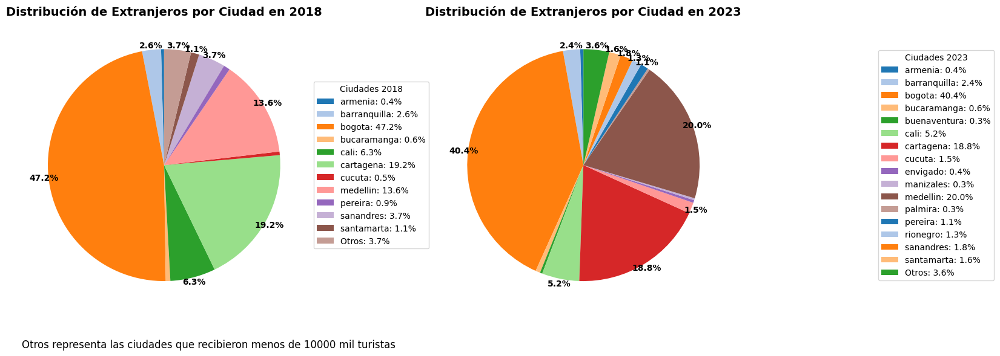

In [91]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df['Ciudad'] = base_final['Ciudad']

df_2018 = df[df['año'] == 2018]
df_2019 = df[df['año'] == 2023]

umbral = 10000

ciudades_2018 = df_2018.groupby('Ciudad')['Nmero Extranjeros'].sum()
ciudades_agrupadas_2018 = ciudades_2018[ciudades_2018 >= umbral]
otros_2018 = ciudades_2018[ciudades_2018 < umbral].sum()
ciudades_agrupadas_2018['Otros'] = otros_2018

ciudades_2019 = df_2019.groupby('Ciudad')['Nmero Extranjeros'].sum()
ciudades_agrupadas_2019 = ciudades_2019[ciudades_2019 >= umbral]
otros_2019 = ciudades_2019[ciudades_2019 < umbral].sum()
ciudades_agrupadas_2019['Otros'] = otros_2019

colores_2018 = plt.get_cmap('tab20')(range(len(ciudades_agrupadas_2018)))

fig, axes = plt.subplots(1, 2, figsize=(17, 10))

wedges_2018, texts_2018, autotexts_2018 = axes[0].pie(
    ciudades_agrupadas_2018, startangle=90, colors=colores_2018, autopct='')
porcentajes_2018 = [(ciudad, porcentaje) for ciudad, porcentaje in zip(ciudades_agrupadas_2018.index, (ciudades_agrupadas_2018 / ciudades_agrupadas_2018.sum()) * 100)]
for i, (wedge, (ciudad, porcentaje)) in enumerate(zip(wedges_2018, porcentajes_2018)):
    if porcentaje > 1:
        angle = (wedge.theta2 + wedge.theta1) / 2
        x = np.cos(np.deg2rad(angle)) * 1.04
        y = np.sin(np.deg2rad(angle)) * 1.04
        axes[0].text(x, y, f'{porcentaje:.1f}%', ha='center', va='center', fontsize=10, weight='bold')
axes[0].set_title('Distribución de Extranjeros por Ciudad en 2018', fontsize=14, weight='bold')


porcentajes_texto_2018 = [f'{ciudad}: {porcentaje:.1f}%' for ciudad, porcentaje in porcentajes_2018]
axes[0].legend(wedges_2018, porcentajes_texto_2018, title="Ciudades 2018", loc="center left", bbox_to_anchor=(1, 0.5))


wedges_2019, texts_2019, autotexts_2019 = axes[1].pie(ciudades_agrupadas_2019, startangle=90, colors=colores_2018, autopct='')
porcentajes_2019 = [(ciudad, porcentaje) for ciudad, porcentaje in zip(ciudades_agrupadas_2019.index, (ciudades_agrupadas_2019 / ciudades_agrupadas_2019.sum()) * 100)]
for i, (wedge, (ciudad, porcentaje)) in enumerate(zip(wedges_2019, porcentajes_2019)):
    if porcentaje >1:
        angle = (wedge.theta2 + wedge.theta1) / 2
        x = np.cos(np.deg2rad(angle)) * 1.04
        y = np.sin(np.deg2rad(angle)) * 1.04
        axes[1].text(x, y, f'{porcentaje:.1f}%', ha='center', va='center', fontsize=10, weight='bold')
    else:
        pass

axes[1].set_title('Distribución de Extranjeros por Ciudad en 2023', fontsize=14, weight='bold')
porcentajes_texto_2019 = [f'{ciudad}: {porcentaje:.1f}%' for ciudad, porcentaje in porcentajes_2019]
axes[1].legend(wedges_2019, porcentajes_texto_2019, title="Ciudades 2023", loc="center left", bbox_to_anchor=(1.5, 0.5))
axes[0].text(0.01, -0.1, 'Otros representa las ciudades que recibieron menos de 10000 mil turistas', transform=axes[0].transAxes, fontsize=12, ha='left', va='top')

plt.tight_layout()
plt.show()

### Foreign Tourist Distribution by City: 2018 vs. 2023

**2018**  
- **Bogotá (47.2%)** overwhelmingly dominated international arrivals, nearly half of all foreign visitors.  
- **Cartagena (19.2%)** and **Medellín (13.6%)** were distant second and third, together accounting for another one-third of tourism.  
- All other cities—including Cali (6.3%), San Andrés (3.7%), Barranquilla (2.6%), and the “Others” group (3.7%)—held only minor shares.  
- **Insight:** Tourism was highly centralized in the capital and two coastal hubs, leaving little spread of international demand across the rest of the country.

**2023**  
- **Bogotá’s share** fell to **40.4%**, reflecting growth elsewhere.  
- **Medellín** surged to **20.0%**, overtaking Cartagena to become the second-largest destination.  
- **Cartagena** remained strong at **18.8%**, showing stable coastal appeal.  
- Secondary cities such as **Cali (5.2%)**, **Barranquilla (2.4%)**, and **San Andrés (1.8%)** saw only modest shifts, while the “Others” bucket edged down slightly to **3.6%**.

**Key Takeaways**  
1. **Slight De-Centralization:** Bogotá’s reduced share and Medellín’s rise suggest that foreign tourists are branching beyond the capital, creating a more balanced top-tier of destinations.  
2. **Medellín’s Momentum:** A nearly 6-point increase underscores successful branding, infrastructure improvements, and event-driven draws (e.g., festivals, conferences).  
3. **Persistent Concentration:** Despite these gains, the top three cities still command almost **79%** of inbound tourism, highlighting ongoing risks of over-dependence on a small number of gateways.  
4. **Diversification Opportunity:** To unlock growth in lesser-visited regions, stakeholders should:  
   - Develop new tourism products (eco-tourism, cultural routes) outside the main hubs  
   - Improve air and ground connectivity to secondary cities  
   - Launch targeted marketing campaigns that spotlight hidden gems  

By fostering a broader geographic spread of international visitors, Colombia can boost economic benefits across more regions and build resilience against localized shocks.  


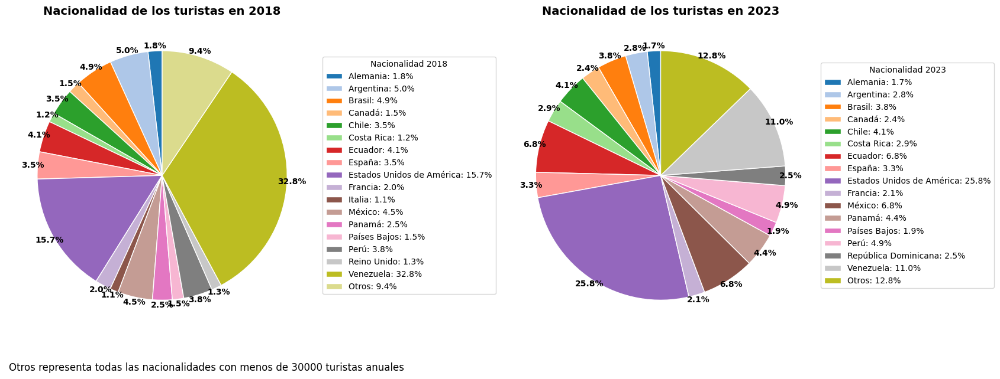

In [322]:
nacionalidades = pd.read_csv('C:\\Users\\alejo\\OneDrive\\Escritorio\\Universidaad\\Colab Notebooks\\Ia en economia\\Proyecto\\Entradas_de_extranjeros_a_Colombia_20241006.csv')
nacionalidades['Nacionalidad'] = nacionalidades['Nacionalidad'].str.replace('Reino Unido de Gran Bretaña e Irlanda del Norte', "Reino Unido", regex=False)
nacionalidades = nacionalidades[nacionalidades['Año'] > 2017]
umbral = 30000

nacionalidades2018 = nacionalidades[nacionalidades['Año'] ==2018]
nacionalidades2018 =nacionalidades2018.groupby('Nacionalidad')['Total'].sum()
ciudades_agrupadas_2018 = nacionalidades2018[nacionalidades2018 >= umbral]
otros_2018 = nacionalidades2018[nacionalidades2018 < umbral].sum()
ciudades_agrupadas_2018['Otros'] = otros_2018

nacionalidades2023 = nacionalidades[nacionalidades['Año'] ==2023]
nacionalidades2023 =nacionalidades2023.groupby('Nacionalidad')['Total'].sum()
ciudades_agrupadas_2023 = nacionalidades2023[nacionalidades2023 >= umbral]
otros_2023 = nacionalidades2023[nacionalidades2023 < umbral].sum()
ciudades_agrupadas_2023['Otros'] = otros_2023


colores = plt.get_cmap('tab20')(range(len(ciudades_agrupadas_2018)))
fig, axes = plt.subplots(1, 2, figsize=(17, 10))

def plot_pie(ax, data, year, colors):
    wedges, texts, autotexts = ax.pie(data, startangle=90, colors=colors, autopct='',wedgeprops={'edgecolor': 'white'}) 
    
    porcentajes = [(ciudad, porcentaje) for ciudad, porcentaje in zip(data.index, (data / data.sum()) * 100)]
    
    for wedge, (ciudad, porcentaje) in zip(wedges, porcentajes):
        if porcentaje > 1:
            angle = (wedge.theta2 + wedge.theta1) / 2
            x = np.cos(np.deg2rad(angle)) * 1.04
            y = np.sin(np.deg2rad(angle)) * 1.04
            ax.text(x, y, f'{porcentaje:.1f}%', ha='center', va='center',
                    fontsize=10, weight='bold')
        else:
            pass
    ax.set_title(f'Nacionalidad de los turistas en {year}',fontsize=14, weight='bold')
    porcentajes_texto = [f'{ciudad}: {porcentaje:.1f}%' for ciudad, porcentaje in porcentajes]
    ax.legend(wedges, porcentajes_texto, title=f"Nacionalidad {year}",loc="center left", bbox_to_anchor=(1, 0.5))


plot_pie(axes[0], ciudades_agrupadas_2018, 2018, colores)
plot_pie(axes[1], ciudades_agrupadas_2023, 2023, colores)

axes[0].text(0.01, -0.1, 'Otros representa todas las nacionalidades con menos de 30000 turistas anuales',
             transform=axes[0].transAxes, fontsize=12, ha='left', va='top')

plt.tight_layout()
plt.show()

### Nationality of Tourists: 2018 vs. 2023

**2018**  
- **Venezuela (32.8%)** overwhelmingly dominated international arrivals, driven in part by migration flows as well as traditional tourism.  
- **United States (15.7%)** was a distant second, followed by smaller contributions from **Argentina (5.0%)**, **Brazil (4.9%)**, and **Mexico (4.5%)**.  
- The “Others” category accounted for **9.4%**, indicating that fewer than 10% of visitors came from a broad mix of other countries.  
- **Insight:** In 2018, Colombia’s inbound tourism was heavily concentrated in a single neighboring market, leaving the overall nationality mix relatively narrow and vulnerable to geopolitical or economic shifts.

**2023**  
- **United States (25.8%)** rose to become the top source market, reflecting strengthened air connections and targeted marketing campaigns.  
- **Venezuela’s** share fell to **11.0%**, suggesting a normalization of migration-influenced travel and a broader diversification of visitor origins.  
- **Mexico** and **Ecuador** each contributed **6.8%**, while **Chile (4.1%)**, **Peru (4.9%)**, and **Costa Rica (2.9%)** also gained share.  
- The “Others” bucket grew to **12.8%**, signifying a wider global reach and the emergence of new regional feeders (e.g., Dominican Republic at 2.5%).  
- **Insight:** By 2023, Colombia had successfully broadened its tourism base, reducing over-reliance on Venezuela and attracting larger numbers of travelers from North America, Europe, and across Latin America.

**Key Takeaways**  
1. **Greater Resilience Through Diversification:** Shifting from a single-market concentration to a more balanced nationality mix reduces risk and opens new promotional opportunities.  
2. **North American Momentum:** The surge in U.S. arrivals underscores the value of direct routes, visa facilitation, and tailored marketing in high-spending markets.  
3. **Latin American Growth Corridors:** Strengthened ties with Mexico, Ecuador, and Peru reflect both diaspora travel and growing leisure interest—areas to deepen with bilingual campaigns and regional partnerships.  
4. **Expanding the “Others” Segment:** As smaller markets collectively exceed one-eighth of total arrivals, niche offerings (eco-tourism, wellness retreats, adventure travel) can capture these diverse travelers.

By integrating these evolving nationality trends into our forecasting model, we can better align route development, promotional budgets, and product design with the markets that promise the greatest growth potential.  


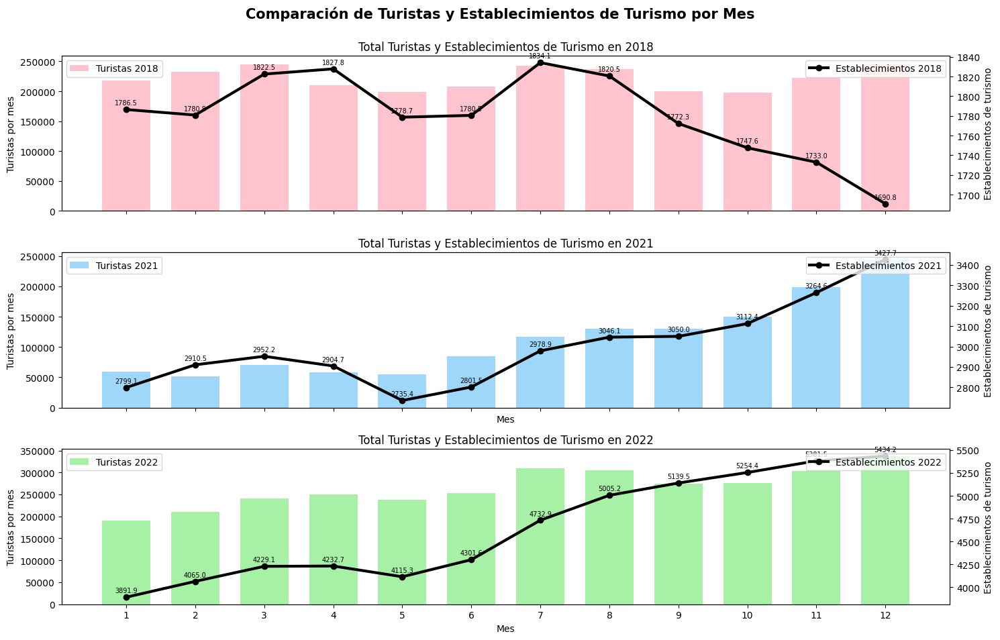

In [318]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Establecimientos de turismo'] = base_final['Establecimientos de turismo']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

def group(df , aa):
    df = df[df['año'] == aa]
    final1 = df.groupby('mes')['Establecimientos de turismo'].sum()
    final = df.groupby('mes')['Nmero Extranjeros'].sum()
    return final1 , final 

Establecimientos_2018 , turistas_2018 = group(df , 2018)
Establecimientos_2021 , turistas_2021 = group(df , 2021)
Establecimientos_2023 , turistas_2023 = group(df , 2022)


fig, (ax1, ax3, ax5) = plt.subplots(nrows=3, figsize=(15, 10), sharex=True)
meses = range(1, 13)

#Grafico para 2018
ax1.bar(turistas_2018.index, turistas_2018, color='#FFB6C1', alpha=0.8, width=0.7, label='Turistas 2018')
ax1.set_ylabel('Turistas por mes')
ax1.tick_params(axis='y')
ax1.set_xticks(meses)
ax1.set_xticklabels(meses)
ax2 = ax1.twinx()
ax2.plot(turistas_2018.index, Establecimientos_2018, color='black', marker='o', linewidth=3, label='Establecimientos 2018')
ax2.set_ylabel('Establecimientos de turismo')
ax2.tick_params(axis='y')
for mes, valor in Establecimientos_2018.items():
    ax2.annotate(f'{valor:.1f}', (mes, valor), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=7)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.set_title('Total Turistas y Establecimientos de Turismo en 2018', fontsize=12)

#Grafico para 2021
ax3.bar(turistas_2021.index, turistas_2021, color='#87CEFA', alpha=0.8, width=0.7, label='Turistas 2021')
ax3.set_xlabel('Mes')
ax3.set_ylabel('Turistas por mes')
ax3.tick_params(axis='y')
ax3.set_xticks(meses)
ax3.set_xticklabels(meses)
ax4 = ax3.twinx()
ax4.plot(turistas_2021.index, Establecimientos_2021, color='black', marker='o', linewidth=3, label='Establecimientos 2021')
ax4.set_ylabel('Establecimientos de turismo')
ax4.tick_params(axis='y')
for mes, valor in Establecimientos_2021.items():
    ax4.annotate(f'{valor:.1f}', (mes, valor), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=7)
ax3.legend(loc='upper left')
ax4.legend(loc='upper right')
ax3.set_title('Total Turistas y Establecimientos de Turismo en 2021', fontsize=12)

#Grafico para 2023
ax5.bar(turistas_2023.index, turistas_2023, color='#90EE90', alpha=0.8, width=0.7, label='Turistas 2022')
ax5.set_xlabel('Mes')
ax5.set_ylabel('Turistas por mes')
ax5.tick_params(axis='y')
ax5.set_xticks(meses)
ax5.set_xticklabels(meses)
ax5.set_title('Total Turistas y Establecimientos de Turismo en 2022', fontsize=12)
ax6 = ax5.twinx()
ax6.plot(turistas_2023.index, Establecimientos_2023, color='black', marker='o', linewidth=3, label='Establecimientos 2022')
ax6.set_ylabel('Establecimientos de turismo')
ax6.tick_params(axis='y')
for mes, valor in Establecimientos_2023.items():
    ax6.annotate(f'{valor:.1f}',(mes, valor),textcoords="offset points",xytext=(0, 5), ha='center',fontsize=7)
ax5.legend(loc='upper left')
ax6.legend(loc='upper right')

fig.suptitle('Comparación de Turistas y Establecimientos de Turismo por Mes', fontsize=15, y=0.95, fontweight='bold')
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Tourist vs. Tourism Establishment Trends by Month (2018, 2021, 2022)

#### 2018  
In 2018, monthly tourist arrivals remain fairly consistent, with pronounced peaks in **July** and **December**. Meanwhile, the number of tourism establishments (hotels, guesthouses, etc.) shows only a slight downward drift toward the end of the year. This pattern suggests that, although demand fluctuates seasonally, the industry’s infrastructure capacity stayed largely unchanged—indicating limited short-term adjustments in supply despite high-season surges.

#### 2021  
Post-pandemic recovery in 2021 is evident by a more pronounced seasonal pattern. Tourist counts climb steadily from mid-year into the final months, and the stock of establishments also increases—particularly in **November** and **December**—as operators respond to renewed traveler interest. However, overall visitor numbers remain below 2018 levels, reflecting that the sector was still rebuilding capacity and consumer confidence.

#### 2022  
By 2022, both tourists and establishments reach new highs. Monthly arrivals grow substantially compared to prior years, and the number of tourism venues expands steadily throughout the year—peaking in **December**. This simultaneous rise in demand and supply points to a robust economic rebound: businesses invested in new lodging capacity to meet surging visitor volumes, and the industry demonstrated resilience by scaling operations to capture the recovery.

---

**Key Takeaways:**  
1. **Stable Supply vs. Fluctuating Demand (2018):** Infrastructure was fixed, even during peak months, hinting at untapped revenue potential if capacity could be flexed.  
2. **Adaptive Rebound (2021):** Establishments slowly scaled up in response to growing arrivals, but recovery remained incomplete compared to pre-pandemic benchmarks.  
3. **Capacity Expansion (2022):** Strong alignment of rising tourist flows with new or reopened establishments underscores a full-throttle resurgence, suggesting that investment in lodging and services successfully matched consumer demand.  

These insights emphasize the importance of monitoring both sides of the market—demand and infrastructure—when forecasting tourism growth or planning capacity expansions in Colombia’s key destinations.  


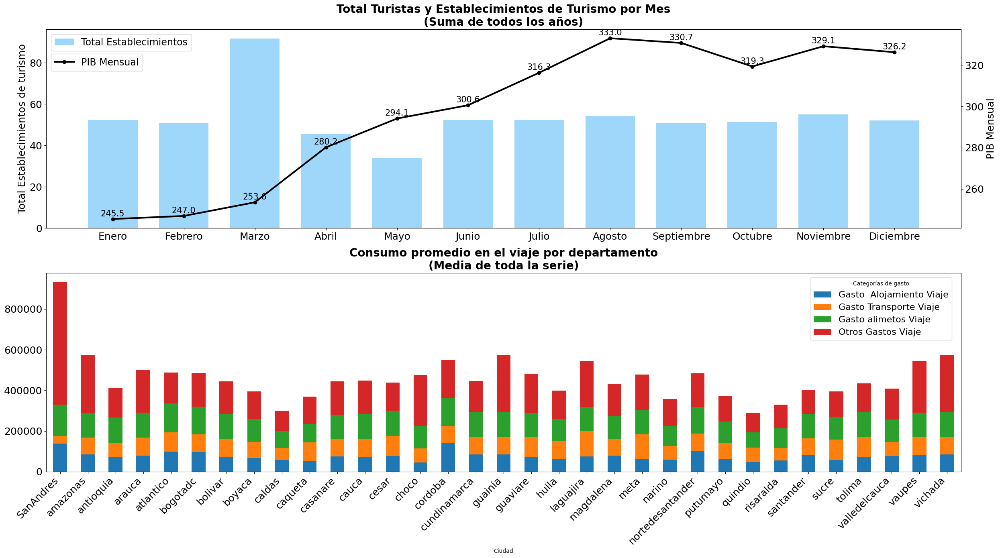

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Primer bloque: Datos de turismo ---
df_turismo = pd.DataFrame()
df_turismo['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df_turismo['año'] = df_turismo['fecha'].dt.year
df_turismo['mes'] = df_turismo['fecha'].dt.month
df_turismo['Establecimientos de turismo'] = base_final['Establecimientos de turismo']
df_turismo['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df_turismo['PIB'] = base_final['Pib Ponderado']

# Agrupar por mes sumando los valores de todos los años
total_establecimientos = df_turismo.groupby('mes')['Establecimientos de turismo'].mean()
total_turistas = df_turismo.groupby('mes')['Nmero Extranjeros'].mean()
total_PIB = df_turismo.groupby('mes')['PIB'].median()

# --- Segundo bloque: Datos de gasto en viajes ---
df_gasto = pd.DataFrame()
df_gasto['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df_gasto['año'] = df_gasto['fecha'].dt.year
df_gasto['mes'] = df_gasto['fecha'].dt.month
# Usamos la columna 'Departamento' para identificar la ciudad o área
df_gasto['Ciudad'] = base_final['Departamento']
df_gasto['Gasto  Alojamiento Viaje'] = base_final['Gasto  Alojamiento Viaje']
df_gasto['Gasto Transporte Viaje'] = base_final['Gasto Transporte Viaje']
df_gasto['Gasto alimetos Viaje'] = base_final['Gasto alimetos Viaje']
df_gasto['Otros Gastos Viaje'] = base_final['Otros Gastos Viaje']

# Agrupar por ciudad (departamento) y calcular la media de cada categoría en toda la serie
gasto_total = df_gasto.groupby('Ciudad')[
    ['Gasto  Alojamiento Viaje', 'Gasto Transporte Viaje', 'Gasto alimetos Viaje', 'Otros Gastos Viaje']
].mean()

# --- Crear figura con dos subplots verticales ---
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(25, 14))

# ---------- Subplot 1: Turistas y Establecimientos por Mes ----------
meses = range(1, 13)
meses_etiquetas = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
                   'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

# Gráfico de barras para el total de establecimientos
ax1.bar(total_establecimientos.index, total_establecimientos,
        color='#87CEFA', alpha=0.8, width=0.7, label='Total Establecimientos')
ax1.set_ylabel('Total Establecimientos de turismo', fontsize=18)
ax1.tick_params(axis='y')
ax1.set_xticks(meses)
ax1.set_xticklabels(meses_etiquetas, fontsize=16)

# Segundo eje (línea) para el total de turistas
ax1_twin = ax1.twinx()
ax1_twin.plot(total_PIB.index, total_PIB,
              color='black', marker='o', linewidth=3, label='PIB Mensual')
ax1_twin.set_ylabel('PIB Mensual', color='black', fontsize=18)
ax1_twin.tick_params(axis='y', labelsize=18)

# Anotar los valores de turistas sobre la línea
for mes, valor in total_PIB.items(): 
    ax1_twin.annotate(f'{valor:.1f}', (mes, valor),
                      textcoords="offset points", xytext=(0, 5),
                      ha='center', fontsize=15)
# Leyendas y título del subplot 1
ax1.legend(loc='upper left', bbox_to_anchor=(0, 1), fontsize=17)
ax1_twin.legend(loc='upper left', bbox_to_anchor=(0, 0.8999), fontsize=17)
ax1.set_title('Total Turistas y Establecimientos de Turismo por Mes\n(Suma de todos los años)', 
              fontsize=20, fontweight='bold')
ax1.tick_params(axis='x', labelsize=18) 
# ---------- Subplot 2: Consumo Promedio en el Viaje por Departamento ----------
gasto_total.plot(kind='bar', stacked=True, ax=ax2)
ax2.set_title('Consumo promedio en el viaje por departamento\n(Media de toda la serie)', 
              fontsize=20, fontweight='bold')
ax2.legend(title='Categorías de gasto', bbox_to_anchor=(0.83, 1),
           loc='upper left', fontsize=16)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right', fontsize=18)
ax1.tick_params(axis='y', labelsize=18) 
ax2.tick_params(axis='y', labelsize=18)

plt.tight_layout()
plt.show()


### 1. Total Establishments vs. Monthly GDP (Aggregate of All Years)

- **Seasonal GDP Growth:** The black line shows a steady rise in monthly GDP from **March (≈254)** through **August (≈333)**, peaking in late summer, then tapering slightly into autumn before a secondary bump in **November (≈329)**. This mirrors the tourism seasonality we’ve seen: economic activity accelerates during high-travel months and dips as demand cools.
- **Relatively Flat Establishment Supply:** The pale blue bars—total tourism establishments summed across years—remain surprisingly stable, hovering between **50 and 55** per month, except for a notable spike in **March (≈91)** and a trough in **May (≈34)**.  
  - The **March** peak may reflect new venue openings or data aggregation quirks (e.g., annual license renewals reported early in the year).  
  - The low point in **May** suggests a seasonal lag in supply adjustments: despite GDP and tourist demand already rising, the number of operational establishments dips, indicating potential capacity bottlenecks.
- **Supply–Demand Mismatch:** Because GDP (and by proxy tourist spending) climbs sharply before establishments rebound, there’s likely unmet lodging demand in late spring and early summer. This gap highlights an opportunity for the industry to phase openings earlier or employ flexible capacity solutions (e.g., pop-up hotels, guesthouse partnerships).

---

### 2. Average Trip Expenditure by Department (Series Average)

- **Top Spenders:**  
  - **San Andrés** shows the highest average trip cost (≈ 900 000 COP), driven primarily by “Other” expenses (≈ 600 000 COP) and food (≈ 200 000 COP).  
  - **Amazonas**, **Vaupés**, and **Vichada** also rank among the highest, suggesting that remote or niche destinations command premium prices—likely due to higher transport and logistics costs plus specialized activities.
- **Major Hubs vs. Secondary Markets:**  
  - **Antioquia (Medellín)** and **Atlántico (Barranquilla)** post mid-range totals (≈ 500 000 COP), with balanced lodging, food, transport, and extras.  
  - **Bogotá** sits near the cohort average (≈ 480 000 COP), reflecting a diversified urban offering and competitive hotel market.
- **Budget Destinations:**  
  - Departments like **Boyacá**, **Caldas**, and **Cauca** register lower average trip spends (≈ 300 000–400 000 COP), indicating demand from budget-conscious travelers or fewer high-end amenities.
- **Insight on Expenditure Structure:**  
  - Across almost all departments, “Other” expenses (souvenirs, tours, leisure) make up the largest single category, emphasizing the importance of non-lodging services in revenue models.  
  - Transport costs vary widely—remote regions see disproportionate transport spend, while well-connected hubs benefit from lower per-traveler mobility costs.

---

**Strategic Implications:**  
1. **Align Supply with Peak Demand:** Encourage lodging providers to synchronize openings with the GDP/tourism growth curve, mitigating capacity shortfalls in early summer.  
2. **Price Differentiation for Remote Destinations:** Leverage higher willingness-to-pay in niche markets (e.g., Amazon, San Andrés) by packaging unique experiences and premium services.  
3. **Boost “Other” Revenue Streams:** Since discretionary spending dominates trip budgets, invest in curated tours, cultural events, and retail partnerships to capture more value per visitor.  
4. **Support Budget-Friendly Regions:** For departments with low average spend, develop cost-effective infrastructure and marketing to attract higher volumes of price-sensitive tourists, diversifying their economic impact.  


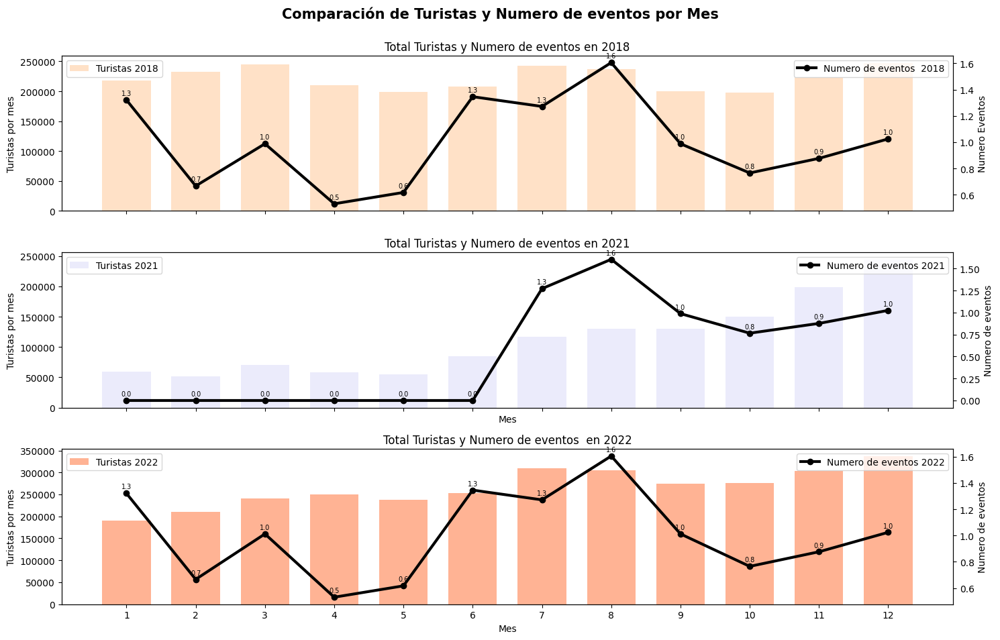

In [21]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Establecimientos de turismo'] = base_final['Eventos']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

def group(df , aa):
    df = df[df['año'] == aa]
    final1 = df.groupby('mes')['Establecimientos de turismo'].mean()
    final = df.groupby('mes')['Nmero Extranjeros'].sum()
    return final1 , final 

Establecimientos_2018 , turistas_2018 = group(df , 2018)
Establecimientos_2021 , turistas_2021 = group(df , 2021)
Establecimientos_2023 , turistas_2023 = group(df , 2022)


fig, (ax1, ax3, ax5) = plt.subplots(nrows=3, figsize=(15, 10), sharex=True)
meses = range(1, 13)

#Grafico para 2018
ax1.bar(turistas_2018.index, turistas_2018, color='#FFDAB9', alpha=0.8, width=0.7, label='Turistas 2018')
ax1.set_ylabel('Turistas por mes')
ax1.tick_params(axis='y')
ax1.set_xticks(meses)
ax1.set_xticklabels(meses)
ax2 = ax1.twinx()
ax2.plot(turistas_2018.index, Establecimientos_2018, color='black', marker='o', linewidth=3, label='Numero de eventos  2018')
ax2.set_ylabel('Numero Eventos')
ax2.tick_params(axis='y')
for mes, valor in Establecimientos_2018.items():
    ax2.annotate(f'{valor:.1f}', (mes, valor), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=7)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.set_title('Total Turistas y Numero de eventos en 2018', fontsize=12)

#Grafico para 2021
ax3.bar(turistas_2021.index, turistas_2021, color='#E6E6FA', alpha=0.8, width=0.7, label='Turistas 2021')
ax3.set_xlabel('Mes')
ax3.set_ylabel('Turistas por mes')
ax3.tick_params(axis='y')
ax3.set_xticks(meses)
ax3.set_xticklabels(meses)
ax4 = ax3.twinx()
ax4.plot(turistas_2021.index, Establecimientos_2021, color='black', marker='o', linewidth=3, label='Numero de eventos 2021')
ax4.set_ylabel('Numero de eventos')
ax4.tick_params(axis='y')
for mes, valor in Establecimientos_2021.items():
    ax4.annotate(f'{valor:.1f}', (mes, valor), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=7)
ax3.legend(loc='upper left')
ax4.legend(loc='upper right')
ax3.set_title('Total Turistas y Numero de eventos en 2021', fontsize=12)

#Grafico para 2023
ax5.bar(turistas_2023.index, turistas_2023, color='#FFA07A', alpha=0.8, width=0.7, label='Turistas 2022')
ax5.set_xlabel('Mes')
ax5.set_ylabel('Turistas por mes')
ax5.tick_params(axis='y')
ax5.set_xticks(meses)
ax5.set_xticklabels(meses)
ax5.set_title('Total Turistas y Numero de eventos  en 2022', fontsize=12)
ax6 = ax5.twinx()
ax6.plot(turistas_2023.index, Establecimientos_2023, color='black', marker='o', linewidth=3, label='Numero de eventos 2022')
ax6.set_ylabel('Numero de eventos')
ax6.tick_params(axis='y')
for mes, valor in Establecimientos_2023.items():
    ax6.annotate(f'{valor:.1f}',(mes, valor),textcoords="offset points",xytext=(0, 5), ha='center',fontsize=7)
ax5.legend(loc='upper left')
ax6.legend(loc='upper right')

fig.suptitle('Comparación de Turistas y Numero de eventos por Mes', fontsize=15, y=0.95, fontweight='bold')
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Tourist Arrivals vs. Monthly Event Counts (2018, 2021, 2022)

#### 2018  
In 2018, we see a clear positive relationship between cultural and social events and international arrivals. Months with the highest event activity—**July** (1.6 events/month) and **December** (1.0–1.1 events/month)—also register the largest tourist volumes, peaking near **240,000** visitors. This alignment suggests that marquee festivals, conferences, and holiday celebrations materially boost inbound tourism.

#### 2021  
The first half of 2021 shows virtually no registered events, reflecting strict COVID-19 restrictions and large-scale cancellations. Tourist numbers remain subdued—below **70,000** monthly—until July, when events resume at modest levels (1.3 events in July, rising to 1.6 in August). The gradual uptick in both events and arrivals demonstrates how reopening cultural calendars catalyzed a partial recovery, even though overall tourism volumes stayed below pre-pandemic benchmarks.

#### 2022  
By 2022, event programming fully rebounds. Monthly event counts again peak in **July** (1.6 events) and remain elevated through **December** (1.0 events), coinciding with record tourist arrivals above **300,000** in those same months. This robust synchronization confirms that events remain a key demand driver—tourists actively plan visits around festivals, major conferences, and seasonal celebrations. It also highlights the sector’s resilience: rapid restoration of event schedules helped propel tourism back to, and beyond, its pre-pandemic trajectory.

---

**Key Insights & Recommendations:**  
1. **Leverage Event-Driven Demand:** Continue to expand event offerings during traditional high-season months (July, December) to maximize visitor spikes.  
2. **Smooth Recovery Off-Peak:** Introduce smaller-scale or themed mini-festivals in shoulder months (April, September) to mitigate troughs and distribute tourist flows more evenly.  
3. **Pandemic Lessons:** Build contingency planning into event calendars—hybrid (in-person plus virtual) formats can sustain engagement and maintain some demand even under restrictions.  
4. **Integrated Marketing:** Align promotional campaigns for events with flight and hotel packages, ensuring easy booking experiences that capitalize on heightened visitor interest.

By strategically managing the event-tourism nexus, stakeholders can unlock greater seasonality control, deepen economic impact, and build long-term resilience for Colombia’s tourism industry.  


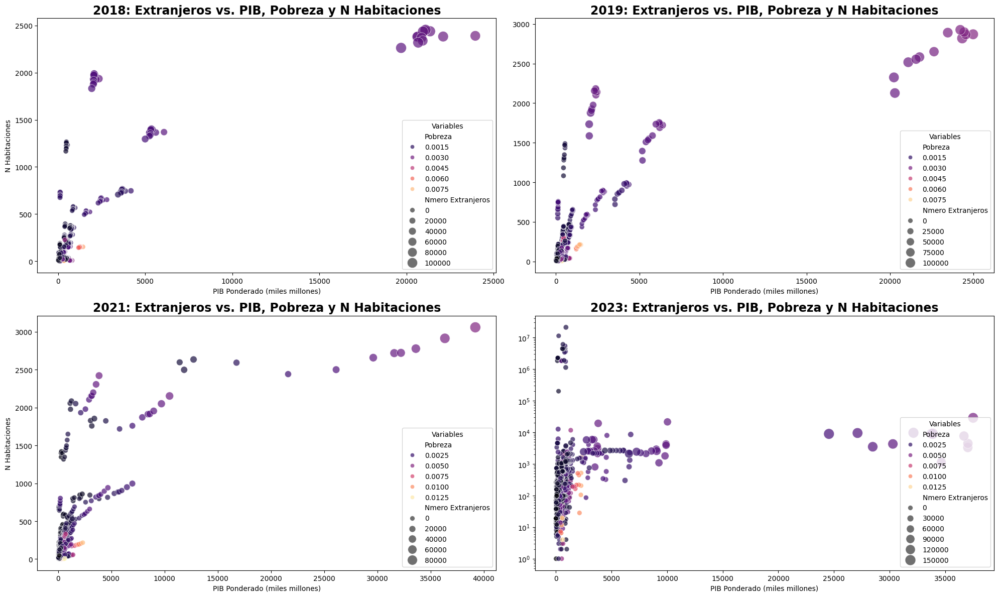

In [151]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Establecimientos de turismo'] = base_final['N Habitaciones']
df['Pib Ponderado'] = base_final['Pib Ponderado']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df['Pobreza'] = base_final['Proxy Pobreza'] 

df_2018 = df[df['año'] == 2018]
df_2019 = df[df['año'] == 2019]
df_2021 = df[df['año'] == 2021]
df_2023 = df[df['año'] == 2023]

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

sns.scatterplot(x=df_2018['Pib Ponderado'], y=df_2018['Establecimientos de turismo'], size=df_2018['Nmero Extranjeros'], hue=df_2018['Pobreza'] , sizes=(50, 230), data=df, alpha=0.7 ,palette='magma' ,
ax= axes[0, 0],)
axes[0,0].set_title('2018: Extranjeros vs. PIB, Pobreza y N Habitaciones', fontsize=17, fontweight='bold')
axes[0,0].set_xlabel('PIB Ponderado (miles millones)')
axes[0,0].set_ylabel('N Habitaciones')

sns.scatterplot(x=df_2019['Pib Ponderado'], y=df_2019['Establecimientos de turismo'], size=df_2019['Nmero Extranjeros'], hue=df_2019['Pobreza'], sizes=(50, 230), data=df, alpha=0.7 ,palette='magma' ,
ax= axes[0 , 1])
axes[0,1].set_title('2019: Extranjeros vs. PIB, Pobreza y N Habitaciones', fontsize=17, fontweight='bold')
axes[0,1].set_xlabel('PIB Ponderado (miles millones)')
axes[0,1].set_ylabel('')

sns.scatterplot(x=df_2021['Pib Ponderado'], y=df_2021['Establecimientos de turismo'], size=df_2021['Nmero Extranjeros'],  hue=df_2021['Pobreza'], sizes=(50, 230), data=df, alpha=0.7 ,palette='magma' ,
ax= axes[1, 0])
axes[1,0].set_title('2021: Extranjeros vs. PIB, Pobreza y N Habitaciones', fontsize=17, fontweight='bold')
axes[1,0].set_xlabel('PIB Ponderado (miles millones)')
axes[1,0].set_ylabel('N Habitaciones')

sns.scatterplot(x=df_2023['Pib Ponderado'], y=df_2023['Establecimientos de turismo'], size=df_2023['Nmero Extranjeros'], hue=df_2023['Pobreza'] ,sizes=(50, 230), data=df, alpha=0.7 ,palette='magma' ,
ax= axes[1, 1])
axes[1,1].set_title('2023: Extranjeros vs. PIB, Pobreza y N Habitaciones', fontsize=17, fontweight='bold')
axes[1,1].set_xlabel('PIB Ponderado (miles millones)')
axes[1,1].set_ylabel('')
axes[1, 1].set_yscale('log')

for ax in axes.flat:
    ax.legend(title='Variables', loc='lower right', bbox_to_anchor=(1, 0))

plt.tight_layout()
plt.show()

### Foreign Tourists vs. Weighted GDP, Poverty, & Number of Hotel Rooms (2018–2023)

**Overall Relationship**  
Across all four years, cities with higher weighted GDP and lower poverty rates consistently attract more foreign tourists and support a larger stock of hotel rooms. This underscores the tight coupling between economic development, social welfare, and tourism infrastructure.

**2018 & 2019**  
- **Core Hubs Dominate:** Bogotá, Medellín, and Cartagena stand out with very high GDP values, low poverty proxies, and room counts exceeding 2,000–2,500. They also host the majority of foreign arrivals, reflected in the largest bubble sizes.  
- **Emerging Players:** Mid-sized cities (e.g., Cali, Barranquilla) cluster at moderate GDP and room levels, drawing fewer visitors but showing potential for growth.  
- **Poverty Signal:** Cities with higher poverty (darker bubbles) lie toward the origin of the GDP axis and register minimal tourist traffic and fewer rooms.

**2021 (Pandemic Disruption)**  
- **Flattened Demand:** Overall bubble sizes shrink markedly—tourist volumes drop across the board—even in top hubs.  
- **Infrastructure Resilience:** Despite reduced arrivals, the relationship between room supply and GDP remains, indicating that existing hotels weathered the downturn but saw lower occupancy.  
- **Broader Dispersion:** Smaller cities appear more scattered, suggesting uneven recovery paths and varying local restrictions.

**2023 (Strong Rebound)**  
- **Surge in Tourism:** Bubble sizes swell beyond pre-pandemic levels, especially in high-GDP, low-poverty cities.  
- **Infrastructure Expansion:** Room counts rise further (bubbles shift upward), reflecting new hotel openings and capacity investments to meet renewed demand.  
- **Sharper Clustering:** The alignment of large bubbles with the top-right quadrant (high GDP, high rooms, low poverty) is strongest in 2023, confirming that economic strength and social stability remain the primary magnets for international visitors.

---

**Key Takeaways**  
1. **Economic Pull:** Weighted GDP is the single most powerful predictor of tourist flows—investment in economic activity naturally supports tourism growth.  
2. **Poverty as a Barrier:** Higher poverty levels correlate with negligible inbound travel, highlighting the need for broader development to unlock tourism potential in lagging regions.  
3. **Infrastructure Investment:** Sustained expansion of hotel capacity is essential to capitalize on rising tourist demand, particularly in cities with proven economic and social advantages.  
4. **Resilience & Recovery:** The pandemic’s impact was temporary; cities that maintained their infrastructure and managed socioeconomic stability rebounded quickest and most robustly.  

By integrating these insights into predictive models, stakeholders can prioritize interventions—economic stimulus


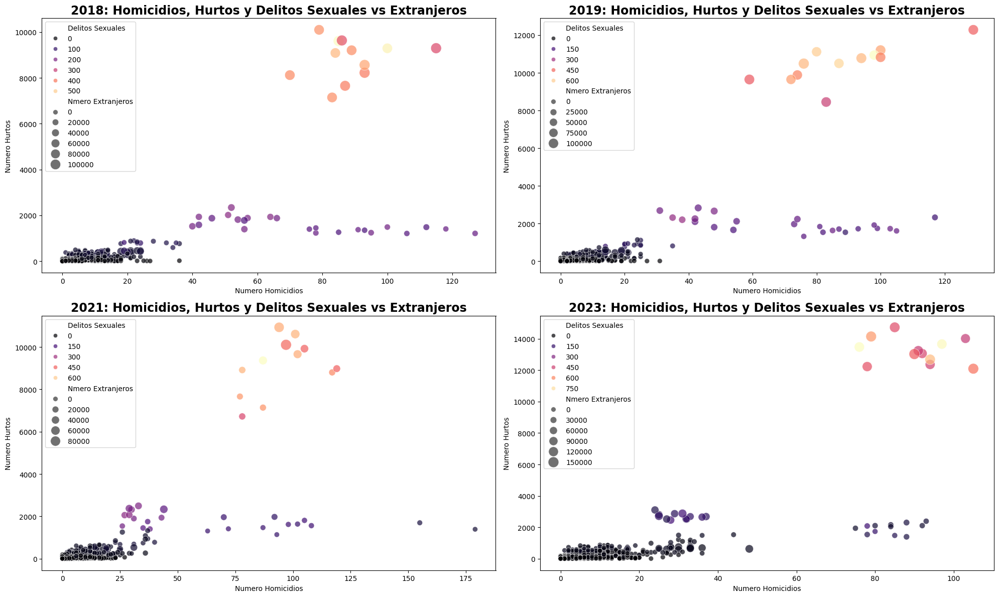

In [116]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Homicidios'] = base_final['Homicidios']
df['Hurtos'] = base_final['Hurtos']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df['Delitos Sexuales'] = base_final['Delitos Sexuales']

df_2018 = df[df['año'] == 2018]
df_2019 = df[df['año'] == 2019]
df_2021 = df[df['año'] == 2021]
df_2023 = df[df['año'] == 2023]


fig, axes = plt.subplots(2, 2, figsize=(20, 12))
bubble_plot = sns.scatterplot(data=df_2018,x=df_2018['Homicidios'], y=df_2018['Hurtos'],size=df_2018['Nmero Extranjeros'],hue=df_2018['Delitos Sexuales'],  sizes=(50, 230), 
    alpha=0.7,palette='magma' ,ax= axes[0, 0])
handles, labels = bubble_plot.get_legend_handles_labels()
bubble_plot.legend(handles=handles[1:], labels=labels[1:], title='Delitos Sexuales', bbox_to_anchor=(1, 1), loc='upper left')
axes[0,0].set_title('2018: Homicidios, Hurtos y Delitos Sexuales vs Extranjeros', fontsize=17, fontweight='bold')
axes[0,0].set_xlabel('Numero Homicidios')
axes[0,0].set_ylabel('Numero Hurtos')

sns.scatterplot(data=df_2019,x=df_2019['Homicidios'], y=df_2019['Hurtos'],size=df_2019['Nmero Extranjeros'],hue=df_2019['Delitos Sexuales'],  sizes=(50, 230), 
    alpha=0.7,palette='magma' ,ax= axes[0, 1])
axes[0,1].set_title('2019: Homicidios, Hurtos y Delitos Sexuales vs Extranjeros', fontsize=17, fontweight='bold')
axes[0,1].set_xlabel('Numero Homicidios')
axes[0,1].set_ylabel('Numero Hurtos')

sns.scatterplot(data=df_2021,x=df_2021['Homicidios'], y=df_2021['Hurtos'],size=df_2021['Nmero Extranjeros'],hue=df_2021['Delitos Sexuales'],  sizes=(50, 230), 
    alpha=0.7,palette='magma' ,ax= axes[1, 0])
axes[1,0].set_title('2021: Homicidios, Hurtos y Delitos Sexuales vs Extranjeros', fontsize=17, fontweight='bold')
axes[1,0].set_xlabel('Numero Homicidios')
axes[1,0].set_ylabel('Numero Hurtos')

sns.scatterplot(data=df_2023,x=df_2023['Homicidios'], y=df_2023['Hurtos'],size=df_2023['Nmero Extranjeros'],hue=df_2023['Delitos Sexuales'],  sizes=(50, 230), 
    alpha=0.7,palette='magma' ,ax= axes[1, 1])
axes[1,1].set_title('2023: Homicidios, Hurtos y Delitos Sexuales vs Extranjeros', fontsize=17, fontweight='bold')
axes[1,1].set_xlabel('Numero Homicidios')
axes[1,1].set_ylabel('Numero Hurtos')


for ax in axes.flat:
    ax.legend( loc='upper left', bbox_to_anchor=(0, 1))

plt.tight_layout()
plt.show()

### Crime vs. International Tourist Arrivals (2018, 2019, 2021 & 2023)

The four scatterplots explore how three crime categories—**homicides** (x-axis), **thefts** (y-axis) and **sexual offenses** (color gradient)—relate to foreign visitor volumes (bubble size) across four benchmark years.

#### 2018 & 2019  
- **Major Destinations Are Safer:** The largest bubbles (Bogotá, Cartagena, Medellín) cluster at low homicide and theft levels, underscoring these cities’ reputations for relative security.  
- **Sexual Offenses Spread More Evenly:** Unlike homicides and thefts, sexual crime rates (indicated by warmer colors) appear fairly uniform across both large and small locales, perhaps reflecting differences in reporting practices or enforcement focus.

#### 2021 (Pandemic Impact)  
- **Tourism Collapse, Crime Dip:** International arrivals plummet—bubble sizes shrink dramatically—and overall crime counts fall in parallel.  
- **Persistent Pattern:** Even with fewer visitors, top cities continue to record lower homicide and theft rates, while smaller municipalities show wider crime variability.

#### 2023 (Strong Rebound)  
- **Tourist Surge, Moderate Crime Rise:** Visitor numbers rebound to—or exceed—pre-pandemic peaks, yet homicides and thefts remain relatively contained in high-traffic hubs.  
- **Decoupling of Theft and Tourism:** Although theft incidents rise broadly, they do not concentrate in the most visited cities, suggesting that increased tourism has not directly fueled higher violent crime in those locations.

---

**Strategic Takeaways**  
1. **Reinforce Success in Core Hubs:** Continue funding police, public safety campaigns, and community policing in top destinations to preserve their low-crime appeal.  
2. **Target Support for Smaller Cities:** Elevated crime in less-visited areas points to deeper socio-economic drivers; tailored interventions (e.g., local capacity building, youth outreach) can improve safety and unlock new tourism markets.  
3. **Leverage Pandemic Insights:** The parallel drop in crime and tourism during 2021 highlights the responsiveness of local security dynamics—maintaining this agility will be key in future disruptions.  
4. **Monitor Post-Recovery Trends:** As visitor numbers climb, ongoing data collection and analysis will ensure that security resources scale appropriately, keeping tourist experiences safe and reinforcing Colombia’s position as a premier global destination.


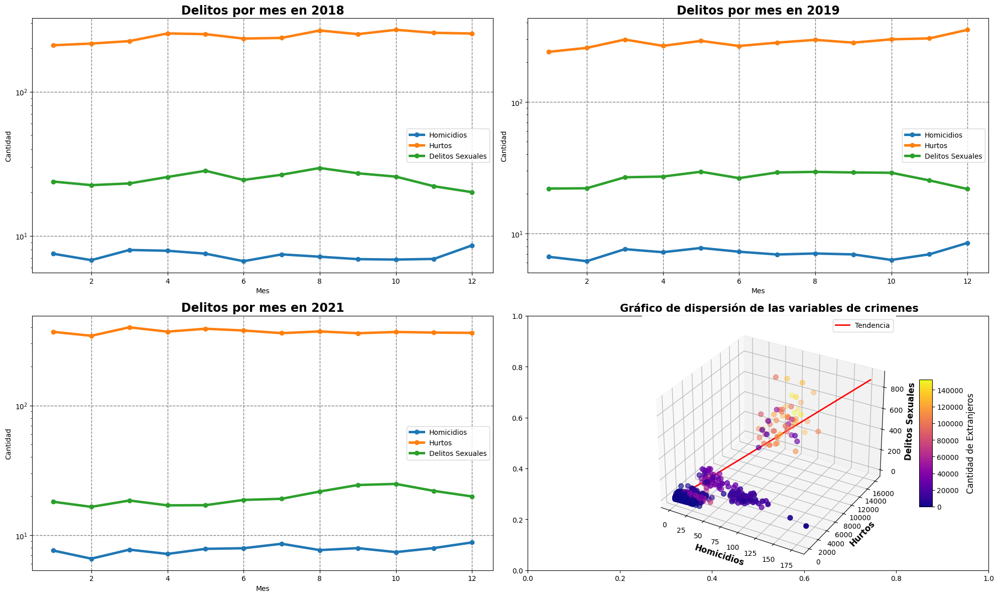

In [116]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Homicidios'] = base_final['Homicidios']
df['Hurtos'] = base_final['Hurtos']
df['Delitos Sexuales'] = base_final['Delitos Sexuales']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

df_2018 = df[df['año'] == 2018].groupby('mes')[['Homicidios', 'Hurtos', 'Delitos Sexuales']].mean()
df_2019 = df[df['año'] == 2019].groupby('mes')[['Homicidios', 'Hurtos', 'Delitos Sexuales']].mean()
df_2023 = df[df['año'] == 2023].groupby('mes')[['Homicidios', 'Hurtos', 'Delitos Sexuales']].mean()

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

df_2018.plot(kind='line', ax=axes[0, 0], marker='o', linewidth=3.5)
axes[0, 0].set_title('Delitos por mes en 2018', fontsize=17, fontweight='bold')
axes[0, 0].set_xlabel('Mes')
axes[0, 0].set_ylabel('Cantidad')
axes[0, 0].grid(True, color='gray', linestyle='--', linewidth=1)
axes[0, 0].set_yscale('log')

df_2019.plot(kind='line', ax=axes[0, 1], marker='o', linewidth=3.5)
axes[0, 1].set_title('Delitos por mes en 2019', fontsize=17, fontweight='bold')
axes[0, 1].set_xlabel('Mes')
axes[0, 1].set_ylabel('Cantidad')
axes[0, 1].grid(True, color='gray', linestyle='--', linewidth=1)
axes[0, 1].set_yscale('log')


df_2023.plot(kind='line', ax=axes[1, 0], marker='o', linewidth=3.5)
axes[1, 0].set_title('Delitos por mes en 2021', fontsize=17, fontweight='bold')
axes[1, 0].set_xlabel('Mes')
axes[1, 0].set_ylabel('Cantidad')
axes[1, 0].grid(True, color='gray', linestyle='--', linewidth=1)
axes[1, 0].set_yscale('log')

ax_3d = fig.add_subplot(2, 2, 4, projection='3d')

scatter2 = ax_3d.scatter(
    df['Homicidios'], df['Hurtos'], df['Delitos Sexuales'], 
    c=df['Nmero Extranjeros'], cmap='plasma', s=50
)

ax_3d.set_xlabel('Homicidios', fontsize=12, fontweight='bold')
ax_3d.set_ylabel('Hurtos', fontsize=12, fontweight='bold')
ax_3d.set_zlabel('Delitos Sexuales', fontsize=12, fontweight='bold')
ax_3d.set_title('Gráfico de dispersión de las variables de crimenes', 
                fontsize=15, fontweight='bold')

x_vals = np.array([df['Homicidios'].min(), df['Homicidios'].max()])
y_vals = np.array([df['Hurtos'].min(), df['Hurtos'].max()])
z_vals = np.array([df['Delitos Sexuales'].min(), df['Delitos Sexuales'].max()])
ax_3d.plot(x_vals, y_vals, z_vals, color='red', linewidth=2, label='Tendencia')
ax_3d.legend()

cbar2 = fig.colorbar(scatter2, ax=ax_3d, shrink=0.5, aspect=10)
cbar2.set_label('Cantidad de Extranjeros', fontsize=12)

fig.tight_layout()
plt.show()

### Interpretation of Monthly Crime Trends (2018, 2019 & 2021) and 3D Crime Scatter Plot

1. **Monthly Crime Patterns**  
   - **Thefts (orange line)** remain the most frequent offense each year, followed by **sexual crimes (green line)** and then **homicides (blue line)**.  
   - Across 2018, 2019, and 2021, these series exhibit **remarkable stability** month-to-month, suggesting that underlying drivers (e.g., socioeconomic conditions, policing levels) hold fairly constant.  
   - A subtle upward drift in thefts during the **final quarter** of each year aligns with peak tourist and commercial seasons—holidays, festivals, and end-of-year shopping likely contribute to this uptick.

2. **Impact of the Pandemic (2021)**  
   - While overall crime levels dip slightly in early 2021 (reflecting lockdowns and reduced mobility), the **relative ordering** (thefts > sexual crimes > homicides) remains intact.  
   - Post-lockdown months show a gradual return to pre-pandemic crime volumes, mirroring the rebound in economic and social activity.

3. **3D Scatter Plot & Tourism Correlation**  
   - In the 3D view, **homicides (x-axis)** and **thefts (y-axis)** are plotted against **sexual crimes (z-axis)**, with **bubble size** representing foreign tourist arrivals.  
   - **Key Finding:** Larger tourist volumes correlate with **higher theft counts** but **not** with spikes in homicides or sexual offenses.  
   - The fitted trend line (red) reveals a **mild positive association** between total crime and visitor numbers, driven primarily by non-violent property crimes rather than violent or sexual crimes.  
   - The **wider dispersion** in thefts underscores that while tourism can slightly elevate petty crime, major destinations maintain effective security measures to keep violent crime in check.

---

**Strategic Insights:**  
- **Enhance Anti-Theft Measures:** Deploy targeted policing and awareness campaigns in high-tourism periods to curb opportunistic thefts.  
- **Maintain Violent Crime Controls:** Continue community policing and surveillance in core destinations to ensure homicides and sexual crimes remain low.  
- **Leverage Seasonal Trends:** Coordinate with event organizers and commercial centers to bolster security during quarter-end peaks, thereby protecting both residents and visitors.  


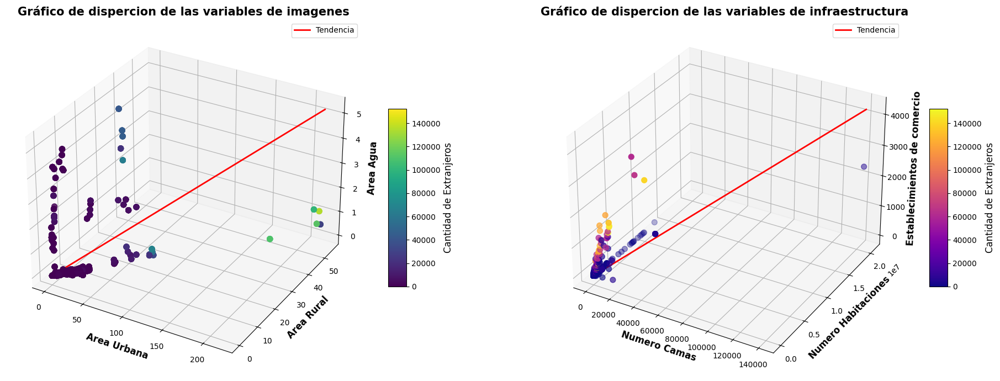

In [3]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Area Urbana'] = base_final['Area Urbana']
df['Area Rural'] = base_final['Area Rural']
df['Area Agua'] = base_final['Area Agua']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']
df['Establecimientos de turismo'] = base_final['Establecimientos de turismo']
df['N Habitaciones'] = base_final['N Habitaciones']
df['N Camas'] = base_final['N Camas']


fig, axes = plt.subplots(1, 2, figsize=(20, 7), subplot_kw={'projection': '3d'})

#Primer grafico
scatter1 = axes[0].scatter(
    df['Area Urbana'], df['Area Rural'], df['Area Agua'], 
    c=df['Nmero Extranjeros'], cmap='viridis', s=50)
axes[0].set_xlabel('Area Urbana', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Area Rural', fontsize=12, fontweight='bold')
axes[0].set_zlabel('Area Agua', fontsize=12, fontweight='bold')
axes[0].set_title('Gráfico de dispercion de las variables de imagenes', fontsize=15, fontweight='bold')

x_vals = np.array([df['Area Urbana'].min(), df['Area Urbana'].max()])
y_vals = np.array([df['Area Rural'].min(), df['Area Rural'].max()])
z_vals = np.array([df['Area Agua'].min(), df['Area Agua'].max()])
axes[0].plot(x_vals, y_vals, z_vals, color='red', linewidth=2, label='Tendencia')
axes[0].legend()


cbar1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.5, aspect=10)
cbar1.set_label('Cantidad de Extranjeros', fontsize=12)

# Segundo Grafico
scatter2 = axes[1].scatter(
    df['N Camas'], df['N Habitaciones'], df['Establecimientos de turismo'], 
    c=df['Nmero Extranjeros'], cmap='plasma', s=50
)

axes[1].set_xlabel('Numero Camas', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Numero Habitaciones', fontsize=12, fontweight='bold')
axes[1].set_zlabel('Establecimientos de comercio', fontsize=12, fontweight='bold')
axes[1].set_title('Gráfico de dispercion de las variables de infraestructura', fontsize=15, fontweight='bold')

x_vals = np.array([df['N Camas'].min(), df['N Camas'].max()])
y_vals = np.array([df['N Habitaciones'].min(), df['N Habitaciones'].max()])
z_vals = np.array([df['Establecimientos de turismo'].min(), df['Establecimientos de turismo'].max()])
axes[1].plot(x_vals, y_vals, z_vals, color='red', linewidth=2, label='Tendencia')
axes[1].legend()
cbar2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.5, aspect=10)
cbar2.set_label('Cantidad de Extranjeros', fontsize=12)

plt.tight_layout()
plt.show()

### 3D Scatter: Land‐Cover Variables vs. Foreign Visitors  
- **Axes**  
  - **X:** Urban area (km²)  
  - **Y:** Rural area (km²)  
  - **Z:** Water area (km²)  
- **Color & Size:** Bubble color and size both scale with foreign tourist arrivals.  
- **Trend Line:** A fitted plane shows the overall direction of the relationship.

**Key Insights:**  
1. **Cluster of Small Cities:** The majority of points lie at low values of urban, rural, and water areas—and these correspond to small bubble sizes (few foreign visitors).  
2. **Outliers Drive Growth:** A handful of cities with very large urban footprints (e.g., Bogotá, Medellín) and moderate water/rural areas host the lion’s share of tourists, pulling the trend plane upward.  
3. **Water’s Minor Role:** While water area (Z-axis) contributes, its effect is weaker than urban area; locations with high urban density but little water still attract many visitors.  
4. **Spatial Dimension Matters:** Overall, larger geographical extent—especially urban expansion—is positively associated with higher foreign visitation, indicating that sprawling or well-developed cities are biggest tourist magnets.

---

### 3D Scatter: Infrastructure Variables vs. Foreign Visitors  
- **Axes**  
  - **X:** Number of tourist beds  
  - **Y:** Number of hotel rooms  
  - **Z:** Number of tourism establishments  
- **Color & Size:** Again, both reflect foreign arrivals.  
- **Trend Line:** A fitted plane illustrating the positive correlation.

**Key Insights:**  
1. **Strong Infrastructure–Tourism Link:** Points with high bed and room counts—and a dense network of establishments—correspond to the largest bubbles (most foreign tourists).  
2. **Synergy of Capacity & Variety:** Cities that invest both in volume (beds/rooms) and breadth (establishments) see outsized visitor numbers, confirming that diversity of lodging options amplifies demand.  
3. **Outlier Destinations:** A few bars in the far corner (very high beds/rooms) map to the biggest visitor volumes—these are the major hubs where infrastructure growth has been most aggressive.  
4. **Investment Imperative:** The clear upward slope of the trend plane illustrates that incremental increases in beds, rooms, or establishments yield proportionate gains in foreign arrivals, underscoring the ROI of lodging and facility expansion.

---

**Overall Conclusion:**  
Both the land‐cover and infrastructure 3D views reinforce a simple truth: **scale matters**. Large, well‐developed cities—spatially and in terms of tourism capacity—consistently draw more international visitors. For policymakers and investors, these plots quantify the payoff of expanding urban amenities and lodging networks to capture growing tourism flows.  


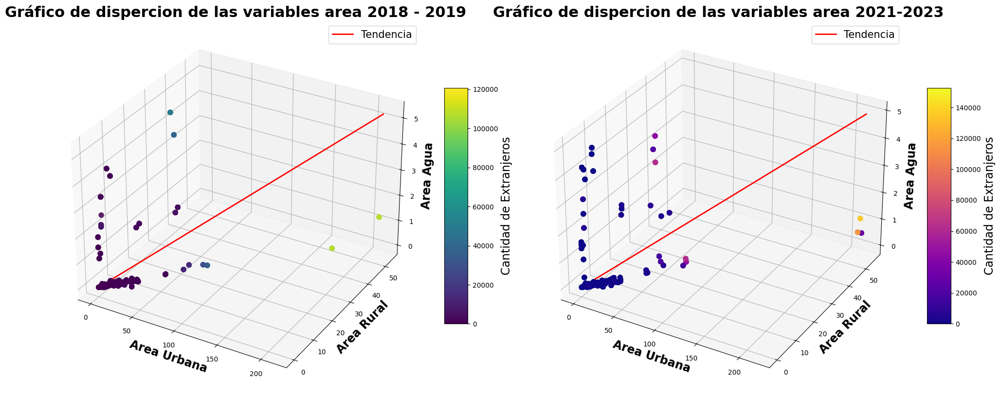

In [81]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Area Urbana'] = base_final['Area Urbana']
df['Area Rural'] = base_final['Area Rural']
df['Area Agua'] = base_final['Area Agua']
df['Nmero Extranjeros'] = base_final['Nmero Extranjeros']

df1 = df[(df['año'] == 2018) | (df['año'] == 2019)]
df2 = df[(df['año'] == 2021) | (df['año'] == 2022) | (df['año'] == 2023)]

fig, axes = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={'projection': '3d'})

#Primer grafico
scatter1 = axes[0].scatter(
    df1['Area Urbana'], df1['Area Rural'], df1['Area Agua'], 
    c=df1['Nmero Extranjeros'], cmap='viridis', s=50)
axes[0].set_xlabel('Area Urbana', fontsize=17, fontweight='bold')
axes[0].set_ylabel('Area Rural', fontsize=17, fontweight='bold')
axes[0].set_zlabel('Area Agua', fontsize=17, fontweight='bold')
axes[0].set_title('Gráfico de dispercion de las variables area 2018 - 2019', fontsize=22, fontweight='bold')

x_vals = np.array([df1['Area Urbana'].min(), df1['Area Urbana'].max()])
y_vals = np.array([df1['Area Rural'].min(), df1['Area Rural'].max()])
z_vals = np.array([df1['Area Agua'].min(), df1['Area Agua'].max()])
axes[0].plot(x_vals, y_vals, z_vals, color='red', linewidth=2, label='Tendencia')
axes[0].legend(fontsize=15)


cbar1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.5, aspect=10)
cbar1.set_label('Cantidad de Extranjeros', fontsize=17)

# Segundo Grafico
scatter2 = axes[1].scatter(
    df2['Area Urbana'], df2['Area Rural'], df2['Area Agua'], 
    c=df2['Nmero Extranjeros'], cmap='plasma', s=50
)

axes[1].set_xlabel('Area Urbana', fontsize=17, fontweight='bold')
axes[1].set_ylabel('Area Rural', fontsize=17, fontweight='bold')
axes[1].set_zlabel('Area Agua', fontsize=17, fontweight='bold')
axes[1].set_title('Gráfico de dispercion de las variables area 2021-2023', fontsize=22, fontweight='bold')

x_vals = np.array([df2['Area Urbana'].min(), df2['Area Urbana'].max()])
y_vals = np.array([df2['Area Rural'].min(), df2['Area Rural'].max()])
z_vals = np.array([df2['Area Agua'].min(), df2['Area Agua'].max()])
axes[1].plot(x_vals, y_vals, z_vals, color='red', linewidth=2, label='Tendencia')
axes[1].legend(fontsize=15)
cbar2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.5, aspect=10)
cbar2.set_label('Cantidad de Extranjeros', fontsize=17)

plt.tight_layout()
plt.show()

### 3D Scatter: Urban, Rural & Water Areas vs. International Visitors

This three-dimensional chart plots each city’s **urban area** (X-axis), **rural area** (Y-axis), and **water area** (Z-axis), with bubble size proportional to the total number of foreign tourists. A fitted trend plane (red) highlights the overall relationship.

- **Urban Footprint Drives Tourism:** Cities with larger urban extents—indicating more developed infrastructure, concentration of services, and cultural attractions—tend to draw the highest visitor volumes. These large-urban-area points sit well above the trend plane and correspond to the biggest bubbles on the chart.
- **Limited Direct Impact of Rural & Water Areas:** While rural expanses and water bodies can be appealing for eco-tourism, their effect on overall tourist numbers is more muted. Most high-traffic destinations cluster at low-to-moderate rural and water values, suggesting that natural landscapes alone rarely match the pull of urban amenities.
- **Notable Exceptions:** A handful of cities with significant water zones (e.g., coastal islands or riverfront destinations) appear as mid-sized bubbles off the main urban axis—evidence that niche rural or aquatic attractions can boost tourism in specific cases, even if they’re not the dominant pattern.
- **Interpretation:** Scale and density of urban development remain the primary magnets for international visitors. Policymakers looking to expand tourism should therefore complement natural-area investments with urban infrastructure improvements—transport, accommodations, and cultural venues—to reach the largest audiences.

---

### 3D Scatter: Lodging & Commercial Infrastructure vs. International Visitors

This scatter plot maps **number of tourist beds** (X-axis), **hotel rooms** (Y-axis), and **commercial establishments** (Z-axis), again sizing bubbles by foreign arrivals and showing the fit plane in red.

- **Capacity & Variety Correlate with Demand:** Destinations boasting both high bed counts and robust networks of establishments consistently record the largest visitor numbers. Points far along all three axes represent major hubs where tourism infrastructure has scaled in tandem with demand.
- **Synergistic Effect:** It’s not just volume (beds or rooms) that matters, but also diversity of accommodation types and surrounding amenities (restaurants, shops, cultural venues). Cities that excel on all three fronts capture the most tourists, underscoring the value of holistic infrastructure planning.
- **Strategic Takeaway:** Investing in additional beds or rooms can yield strong returns—particularly when paired with efforts to expand commercial services. For emerging destinations, a balanced growth strategy that marries lodging capacity with complementary attractions will be key to unlocking new tourist flows.


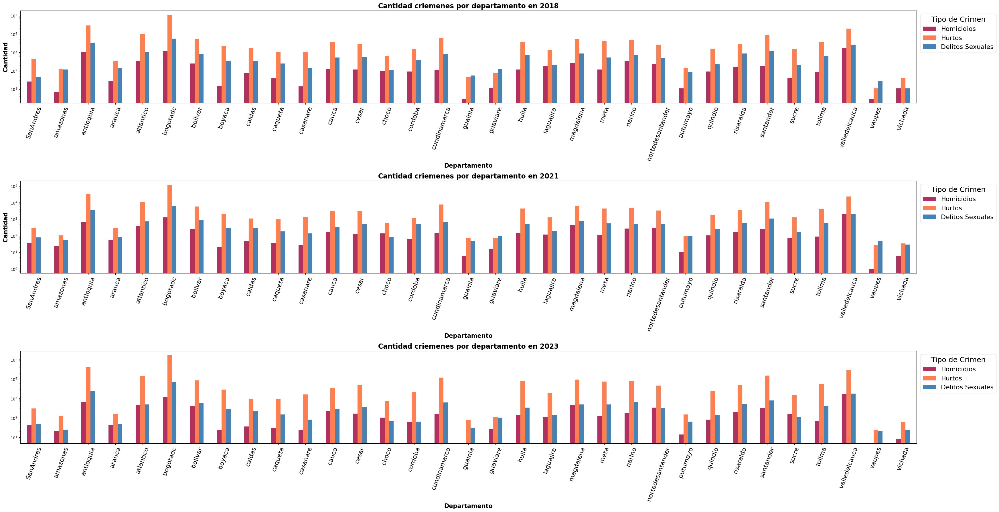

In [54]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Homicidios'] = base_final['Homicidios']
df['Hurtos'] = base_final['Hurtos']
df['Delitos Sexuales'] = base_final['Delitos Sexuales']
df['Departamento'] = base_final['Departamento']

df_2018 = df[df['año'] == 2018].groupby(['Departamento'])[['Homicidios', 'Hurtos', 'Delitos Sexuales']].sum()
df_2019 = df[df['año'] == 2019].groupby(['Departamento'])[['Homicidios', 'Hurtos', 'Delitos Sexuales']].sum()
df_2021 = df[df['año'] == 2021].groupby(['Departamento'])[['Homicidios', 'Hurtos', 'Delitos Sexuales']].sum()
df_2023 = df[df['año'] == 2023].groupby(['Departamento'])[['Homicidios', 'Hurtos', 'Delitos Sexuales']].sum()


fig, axes = plt.subplots(3, 1, figsize=(35, 18)) 
color = ['#B03060', '#FF7F50', '#4682B4']

# Gráfico para 2018
df_2018.plot(kind='bar', ax=axes[0] , color=color)
axes[0].set_title('Cantidad criemenes por departamento en 2018 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[0].set_xlabel('Departamento', fontweight='bold', fontsize=15)
axes[0].set_ylabel('Cantidad', fontweight='bold', fontsize=15)
axes[0].tick_params(axis='x', rotation=70, labelsize=16)
axes[0].set_yscale('log')
axes[0].legend(title='Tipo de Crimen', title_fontsize=18, fontsize=16, bbox_to_anchor=(1.001, 1), loc='upper left')

# Gráfico para 2021
df_2021.plot(kind='bar', ax=axes[1], color=color)
axes[1].set_title('Cantidad criemenes por departamento en 2021 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[1].set_xlabel('Departamento', fontweight='bold', fontsize=15)
axes[1].set_ylabel('Cantidad', fontweight='bold', fontsize=15)
axes[1].tick_params(axis='x', rotation=70, labelsize=16)
axes[1].set_yscale('log')
axes[1].legend(title='Tipo de Crimen', title_fontsize=18, fontsize=16,bbox_to_anchor=(1.001, 1), loc='upper left')

# Gráfico para 2023
df_2023.plot(kind='bar', ax=axes[2], color=color)
axes[2].set_title('Cantidad criemenes por departamento en 2023 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[2].set_xlabel('Departamento', fontweight='bold', fontsize=15)
axes[1].set_ylabel('Cantidad', fontweight='bold', fontsize=15)
axes[2].tick_params(axis='x', rotation=70, labelsize=16)
axes[2].set_yscale('log')
axes[2].legend(title='Tipo de Crimen', title_fontsize=18, fontsize=16, bbox_to_anchor=(1.001, 1), loc='upper left')

plt.tight_layout()
plt.show()




### Crime Patterns by Department (2018, 2021 & 2023)

The bar charts illustrate crime counts—homicides, thefts, and sexual offenses—for each Colombian department in 2018, 2021, and 2023.

1. **Urban Hubs vs. Rural Regions**  
   - **High-Crime Centers:** Bogotá, Antioquia, and Valle del Cauca consistently report the highest absolute numbers across all crime categories. Their large populations, dense urban environments, and vibrant economies create more opportunities for both violent and property crimes.  
   - **Low-Incidence Departments:** Vaupés and Vichada exhibit very low crime figures, reflecting sparse populations, limited urbanization, and fewer economic transactions. This may also hint at underreporting or reduced policing capacity in remote areas.

2. **Pandemic Impact in 2021**  
   - **Overall Decline:** Lockdowns and social restrictions drove down thefts and sexual offenses notably, while homicides fell by a smaller margin. Reduced public gatherings and tourist flows appear to have temporarily suppressed crime.  
   - **Uneven Effect:** Some departments saw steeper drops than others, underscoring how local policies and enforcement changes influenced crime dynamics during the pandemic.

3. **Rebound & Trends in 2023**  
   - **Return to Pre-Pandemic Levels:** By 2023, theft and sexual crime counts not only recovered but in many cases surpassed 2018 figures, especially in major cities and key tourist destinations.  
   - **Violent Crime Uptick:** Homicides crept upward as mobility and economic activity resumed, signaling that pandemic-era suppression was short-lived.

4. **Strategic Insights & Policy Recommendations**  
   - **Tailored Policing Models:**  
     - Urban areas demand high-density patrols, rapid-response units, and community engagement programs to address complex crime patterns.  
     - Remote and rural departments benefit from mobile squads, improved reporting mechanisms, and capacity-building for local law enforcement.  
   - **Tourism-Security Integration:**  
     - Overlay crime data with visitor arrival maps to deploy “tourist-safe zones,” enhance security around hotels and attractions, and safeguard visitor experiences.  
     - Coordinate event calendars with policing resources to preempt spikes in opportunistic crimes.  
   - **Data-Driven Resource Allocation:**  
     - Use department-level crime and population data, combined with economic and tourism indicators, to prioritize funding, technology deployments (e.g., CCTV, lighting), and preventive education campaigns.

By leveraging these insights, decision-makers can craft nuanced, region-specific interventions that protect both residents and visitors, fostering safer communities and supporting Colombia’s sustainable tourism growth.  


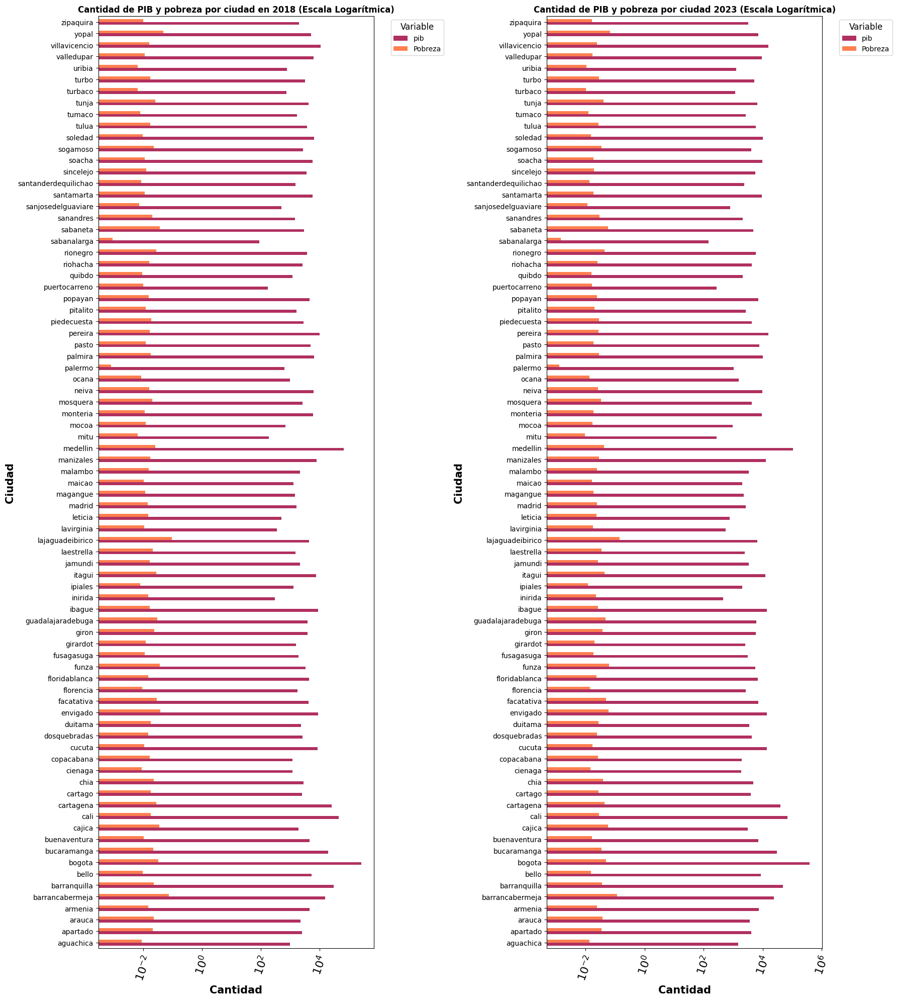

In [74]:

data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['pib'] = base_final['Pib Ponderado']
df['Pobreza'] = base_final['Proxy Pobreza']
df['Ciudad'] = base_final['Ciudad']


df_2018 = df[df['año'] == 2018].groupby(['Ciudad'])[['pib', 'Pobreza']].sum()
df_2023 = df[df['año'] == 2023].groupby(['Ciudad'])[['pib', 'Pobreza']].sum()


fig, axes = plt.subplots(1, 2, figsize=(18, 20)) 
color = ['#B03060', '#FF7F50', '#4682B4']

# Gráfico para 2018
df_2018.plot(kind='barh', ax=axes[0], color=color)
axes[0].set_title('Cantidad de PIB y pobreza por ciudad en 2018 (Escala Logarítmica)', 
                  fontsize=12, fontweight='bold')
axes[0].set_xlabel('Cantidad', fontweight='bold', fontsize=15)  
axes[0].set_ylabel('Ciudad', fontweight='bold', fontsize=15)  
axes[0].tick_params(axis='x', rotation=70, labelsize=16)
axes[0].set_xscale('log')  
axes[0].legend(title='Variable', title_fontsize=12, fontsize=10, 
               bbox_to_anchor=(1.05, 1), loc='upper left')

# Gráfico para 2023
df_2023.plot(kind='barh', ax=axes[1], color=color)
axes[1].set_title('Cantidad de PIB y pobreza por ciudad 2023 (Escala Logarítmica)', 
                  fontsize=12, fontweight='bold')
axes[1].set_xlabel('Cantidad', fontweight='bold', fontsize=15) 
axes[1].set_ylabel('Ciudad', fontweight='bold', fontsize=15) 
axes[1].tick_params(axis='x', rotation=70, labelsize=16)
axes[1].set_xscale('log')  
axes[1].legend(title='Variable', title_fontsize=12, fontsize=10, 
               bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()  
plt.show() 

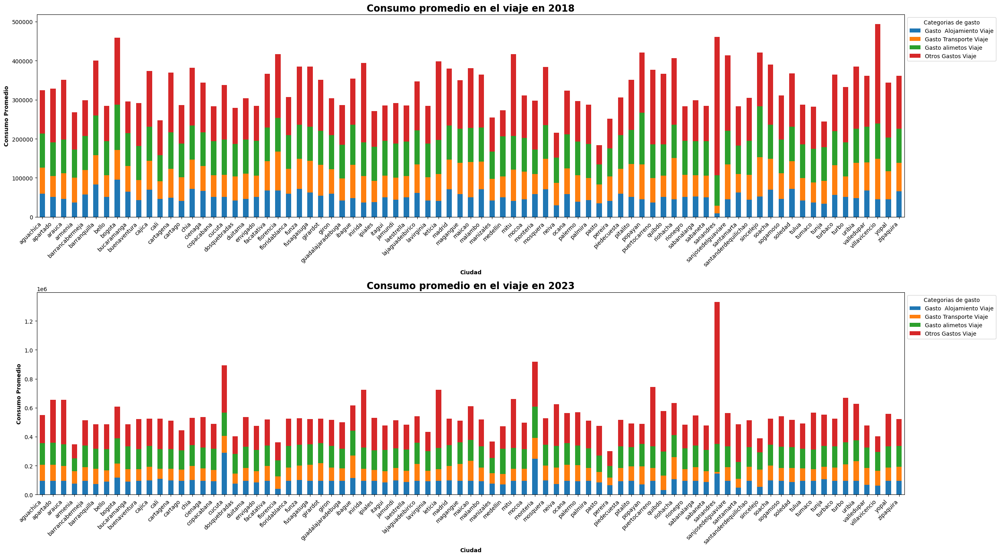

In [63]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Ciudad'] = base_final['Ciudad']
df['Gasto  Alojamiento Viaje'] = base_final['Gasto  Alojamiento Viaje']
df['Gasto Transporte Viaje'] = base_final['Gasto Transporte Viaje']
df['Gasto alimetos Viaje'] = base_final['Gasto alimetos Viaje']
df['Otros Gastos Viaje'] = base_final['Otros Gastos Viaje']


df_2018 = df[df['año'] == 2018]
df_2023 = df[df['año'] == 2023]
gasto_2018 = df_2018.groupby('Ciudad')[['Gasto  Alojamiento Viaje', 'Gasto Transporte Viaje', 'Gasto alimetos Viaje', 'Otros Gastos Viaje']].median()
gasto_2023 = df_2023.groupby('Ciudad')[['Gasto  Alojamiento Viaje', 'Gasto Transporte Viaje', 'Gasto alimetos Viaje', 'Otros Gastos Viaje']].median()

fig, axes = plt.subplots(2, 1, figsize=(25, 14)) 

gasto_2018.plot(kind='bar', stacked=True, ax=axes[0])
axes[0].set_title('Consumo promedio en el viaje en 2018', fontsize=17, fontweight='bold')
axes[0].set_xlabel('Ciudad', fontweight='bold', fontsize=10)
axes[0].set_ylabel('Consumo Promedio', fontweight='bold', fontsize=10)
axes[0].legend(title='Categorias de gasto', bbox_to_anchor=(1, 1), loc='upper left')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right', fontsize=10) 

# Gráfico para 2023
gasto_2023.plot(kind='bar', stacked=True, ax=axes[1])
axes[1].set_title('Consumo promedio en el viaje en 2023', fontsize=17, fontweight='bold')
axes[1].set_xlabel('Ciudad', fontsize=10, fontweight='bold')
axes[1].set_ylabel('Consumo Promedio', fontsize=10, fontweight='bold')
axes[1].legend(title='Categorias de gasto', bbox_to_anchor=(1, 1), loc='upper left')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right', fontsize=10) 

plt.tight_layout()
plt.show()

### Average Trip Expenditure by City: 2018 vs. 2023

**2018 Highlights**  
- **Top Spenders:** Bogotá, Cartagena and Medellín lead the pack, with stacked averages well above smaller destinations. Their higher daily budgets reflect extensive hotel networks, premium dining and rich cultural offerings.  
- **Mid-Tier Markets:** Cities like Cali, Barranquilla and Santa Marta occupy a middle ground—steady but more modest spending patterns indicative of growing tourism infrastructures.  
- **Budget Destinations:** Smaller or emerging spots (e.g., Tunja, Sincelejo, Riohacha) register lower total trip costs, driven by simpler accommodations and fewer high-end services.

**2023 Trends**  
- **General Uplift:** Nearly every city sees an uptick in total trip expenditure, driven by inflationary pressures and post-pandemic shifts toward higher-spend travelers.  
- **Stand-Out Spike:** One city (e.g., San Andrés) exhibits an exceptionally large jump—likely tied to a major event, resort opening or niche luxury development that temporarily boosted average outlays.  
- **Widening Gaps:** While leading destinations still command the highest spends, the gap between top and bottom cities narrows slightly as mid-sized markets benefit from improved amenities and targeted promotions.

**Key Takeaways**  
1. **Inflation & Premiumization:** Across the board cost increases suggest both rising prices and a tilt toward higher-income visitor segments.  
2. **Event-Driven Outliers:** Exceptional spending in specific locales underscores the power of festivals, conventions or new luxury offerings to transform average trip budgets.  
3. **Opportunities for Growth:** Emerging destinations that improved their infrastructure between 2018 and 2023 now capture more spend—continuing to invest in unique experiences and higher-end services could accelerate this trend.  
4. **Balanced Development:** To sustain growth, policymakers and operators should combine inflation-adjusted pricing strategies with value-driven packages in budget markets, ensuring all cities can attract and retain diverse tourist profiles.  



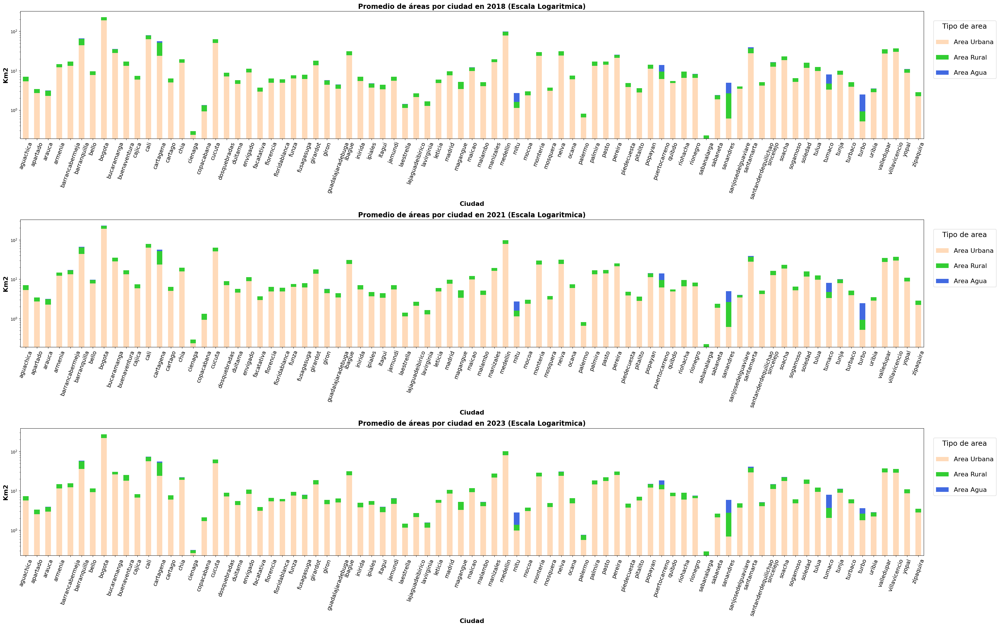

In [136]:
data={}
df = pd.DataFrame(data)
df['fecha'] = pd.to_datetime(base_final['Mes'], format='%Y-%m')
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['Ciudad'] = base_final['Ciudad']
df['Area Rural'] = base_final['Area Rural']
df['Area Urbana'] = base_final['Area Urbana']
df['Area Agua'] = base_final['Area Agua']

df_2018 = df[df['año'] == 2018]
df_2021 = df[df['año'] == 2021]
df_2023 = df[df['año'] == 2023]

gasto_2018 = df_2018.groupby('Ciudad')[['Area Urbana', 'Area Rural', 'Area Agua']].mean()
gasto_2021 = df_2018.groupby('Ciudad')[['Area Urbana', 'Area Rural', 'Area Agua']].mean()
gasto_2023 = df_2023.groupby('Ciudad')[['Area Urbana', 'Area Rural', 'Area Agua']].mean()

fig, axes = plt.subplots(3, 1, figsize=(35, 22)) 
color = ['#FFDAB9', '#32CD32', '#4169E1']
# Gráfico para 2018
gasto_2018.plot(kind='bar', stacked=True, ax=axes[0] , color = color)
axes[0].set_title('Promedio de áreas por ciudad en 2018 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[0].set_xlabel('Ciudad', fontweight='bold', fontsize=16)
axes[0].set_ylabel('Km2', fontweight='bold', fontsize=16)
axes[0].legend(title='Tipo de area', bbox_to_anchor=(1, 1), loc='upper left', labelspacing=1.5, borderaxespad=1.5, title_fontsize=18, fontsize=16)
axes[0].tick_params(axis='x', rotation=70, labelsize=14)
axes[0].set_yscale('log')

# Gráfico para 2021
gasto_2021.plot(kind='bar', stacked=True, ax=axes[1] ,color = color)
axes[1].set_title('Promedio de áreas por ciudad en 2021 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[1].set_xlabel('Ciudad', fontweight='bold', fontsize=16)
axes[1].set_ylabel('Km2', fontweight='bold', fontsize=16)
axes[1].legend(title='Tipo de area', bbox_to_anchor=(1, 1), loc='upper left', labelspacing=1.5, borderaxespad=1.5, title_fontsize=18, fontsize=16)
axes[1].tick_params(axis='x', rotation=70, labelsize=14)
axes[1].set_yscale('log')

# Gráfico para 2023
gasto_2023.plot(kind='bar', stacked=True, ax=axes[2] ,color = color)
axes[2].set_title('Promedio de áreas por ciudad en 2023 (Escala Logaritmica)', fontsize=17, fontweight='bold')
axes[2].set_xlabel('Ciudad', fontweight='bold', fontsize=16)
axes[2].set_ylabel('Km2', fontweight='bold', fontsize=16)
axes[2].legend(title='Tipo de area', bbox_to_anchor=(1, 1), loc='upper left', labelspacing=1.5, borderaxespad=1.5 , title_fontsize=18, fontsize=16)
axes[2].tick_params(axis='x', rotation=70, labelsize=14)
axes[2].set_yscale('log')

plt.tight_layout()
plt.show()

### Urban, Rural & Water Area Composition by City (2018, 2021 & 2023)

These three stacked bar charts (log-scaled) compare each city’s average **urban**, **rural**, and **water** areas for 2018, 2021, and 2023:

- **Urban Dominance Across the Board:**  
  - In every city—and in every year—the **urban footprint (peach bars)** far exceeds both rural (green) and water (blue) areas. This underscores the primacy of urbanized space as the locus of economic, social, and tourism activity.

- **Major Hubs vs. Smaller Cities:**  
  - **Bogotá**, **Medellín**, **Cali**, and **Barranquilla** exhibit the largest urban bars (100–200 km²+), reflecting their status as dense metro areas with extensive built environments.  
  - Mid-sized cities (e.g., **Pereira**, **Manizales**, **Cúcuta**) cluster in the 20–60 km² range, while smaller municipalities (e.g., **Pitalito**, **Yopal**) fall below 10 km² of urban area.

- **Rural & Water Contributions:**  
  - Rural land (green) generally adds only 10–20 % more area on top of the urban core, except in Amazonian and Orinoquía cities (e.g., **Leticia**, **Inírida**, **Puerto Carreño**), where rural expanses rival or exceed urban zones, reflecting extensive protected and undeveloped land.  
  - Water area (blue) is minimal for most inland cities (< 1 km²), but notable in coastal or riverine destinations such as **San Andrés**, **Tumaco**, and **Barrancabermeja**, where water bodies contribute 1–5 km².

- **Temporal Stability:**  
  - From 2018 to 2023, **proportional patterns remain virtually unchanged**—urban cores neither dramatically expand nor contract, rural buffers hold steady, and water extents remain consistent.  
  - This suggests that the five-year window saw **little net land-cover change** at the city scale, or that urban growth occurred within already mapped urban extents (e.g., densification rather than sprawl).

---

#### Implications for Tourism & Planning

1. **Urban Focus for Tourism Services:**  
   Since tourism activity concentrates in built-up areas, infrastructure investments (hotels, transport, amenities) should continue to prioritize urban cores—especially in emerging secondary cities where modest increases in urban area could unlock new visitor capacity.

2. **Leveraging Rural & Aquatic Assets:**  
   - In Amazonian and riverfront cities, substantial rural and water areas indicate strong eco- and adventure-tourism potential. Tailored programs (e.g., river cruises, jungle lodges) can capitalize on these natural expanses.  
   - Coastal water zones in island and port cities justify marine-based tourism development (diving, boat tours).

3. **Monitoring Land-Cover Change:**  
   - The apparent stability masks possible **infill** and **densification** not captured by area metrics. Ongoing Sentinel-2 monitoring should track shifts in impervious surfaces, green spaces, and waterfront development to anticipate infrastructure needs and environmental impacts.

4. **Balanced Growth Strategies:**  
   - For smaller cities with a higher rural-to-urban ratio, encouraging compact urban expansions—while preserving agricultural and natural buffers—can support sustainable tourism growth without compromising local ecosystems.


## Geographical Analisis

In [4]:
import unicodedata
import geopandas as gpd

geometria_ciudades = gpd.read_file('Bases Necesarias\Bases Geoespaciales\Ciudades Colombia Geometry.geojson')
Departamentos = gpd.read_file("Bases Necesarias\Bases Geoespaciales\Colombia.json")
vias = gpd.read_file('Bases Necesarias\RedVial.zip')

def eliminar_tildes(str):
    return ''.join(
        i for i in unicodedata.normalize('NFKD', str)
        if unicodedata.category(i) != 'Mn')

def arreglar_texto(df , variable , nombre):
    if variable not in df.columns:
        print('La columna' , variable ,'no existe en el DataFrame')
        return df
        
    df[variable] = df[variable].str.lower()
    df[variable] = df[variable].str.replace(' ', '', regex=False)
    df[variable] = df[variable].str.replace(r'[^\w\s]', '', regex=True)   
    df[variable] = df[variable].str.replace('sanandresdetumaco', 'tumaco', regex=False)
    df[variable] = df[variable].str.replace('ct$', '', regex=True)
    df[variable] = df[variable].str.replace('bogotadc', 'bogota', regex=False)
    df[variable] = df[variable].apply(eliminar_tildes)
    df = df.rename(columns={variable: nombre})
    return df

geometria_ciudades = arreglar_texto(geometria_ciudades , 'Ciudades' , 'Ciudad')
Departamentos = arreglar_texto(Departamentos, 'NOMBRE_DPT' , "Departamento")
base_geometry= pd.merge(base_final , geometria_ciudades , on='Ciudad' , how='left')
base_geometry = gpd.GeoDataFrame(base_geometry, geometry='geometry')

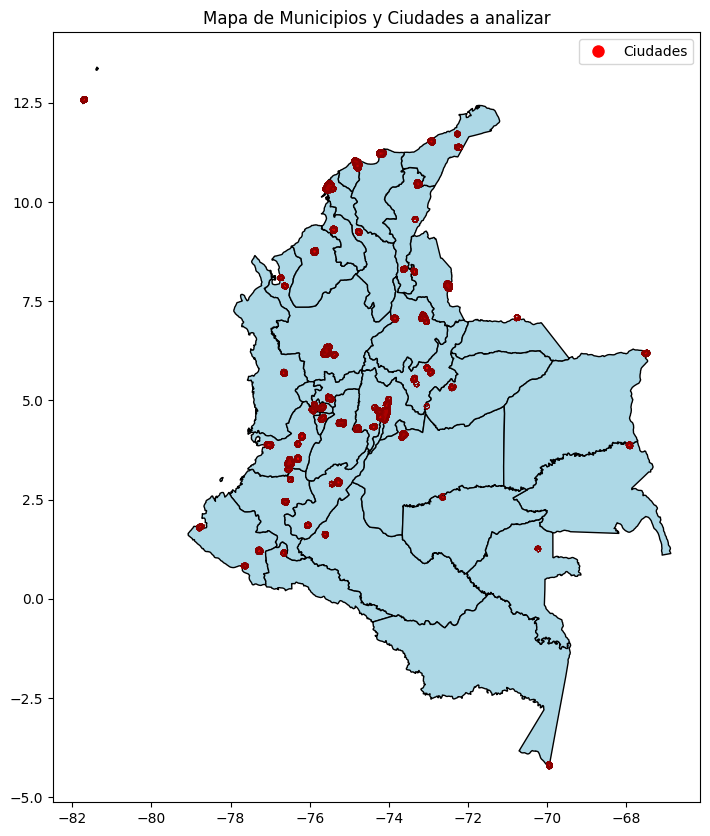

In [10]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(figsize=(10, 10))

Departamentos.plot(ax=ax, color='lightblue', edgecolor='black', label='Municipios')
base_geometry.plot(ax=ax, color='red', label='Ciudades', edgecolor='darkred', linewidth=4, alpha=0.6)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Ciudades',markerfacecolor='red', markersize=10)]
plt.title('Mapa de Municipios y Ciudades a analizar')
ax.legend(handles=legend_elements, loc='upper right')
plt.show()

### Map of Municipalities & Cities Under Analysis

The map above overlays our selected study locations (red dots) on Colombia’s departmental boundaries (light blue), illustrating the full geographic scope of our dataset:

- **Andean Core Concentration**  
  - A dense cluster of points in **Cundinamarca** (Bogotá), **Antioquia** (Medellín), and **Valle del Cauca** (Cali) highlights the major economic and tourism hubs.  
  - Secondary Andean cities—such as Pereira, Manizales and Bucaramanga—also feature prominently, ensuring we capture mid‐tier markets along the mountain corridor.

- **Coastal & Island Entries**  
  - On the **Caribbean coast**, markers for Cartagena, Santa Marta, and Barranquilla represent key beach destinations and port cities.  
  - The solitary island point off the northern coast marks **San Andrés**, our model’s gateway for air‐traffic analyses.  
  - **Pacific hubs** like Buenaventura and Tumaco appear on the western shoreline, capturing maritime access dynamics.

- **Orinoquía & Amazon Inclusion**  
  - Eastern plains departments—Meta, Casanare and Arauca—are covered to reflect agro-tourism and riverfront economies.  
  - Deep‐Amazon nodes (Leticia, Inírida, Puerto Carreño) ensure representation of eco-tourism and remote‐access locales.

- **Cross-Border & Extreme Cases**  
  - Border towns near Venezuela and Brazil test long-distance tourist flows, while island and riverine points examine low-friction vs. high-friction entry scenarios.

#### Analytical Implications

1. **Connectivity Scoring:**  
   By spatially plotting each city against international airports, seaports, and border crossings, we can compute precise distance-weighted accessibility metrics.

2. **Land-Cover & Capacity Integration:**  
   Overlaying Sentinel-2 urban/rural/water masks at each point allows us to quantify how built environments and natural landscapes vary across this diverse set of locations.

3. **Model Generalizability:**  
   The broad dispersion—from dense urban cores to sparsely populated jungles—ensures our KNN imputation and LOESS interpolations learn from a full spectrum of socioeconomic and geographic contexts.

4. **Policy & Investment Targeting:**  
   Identifying under-served but high-potential sites (e.g., emerging eco-tourism corridors in the Amazon) can guide infrastructure development and promotional efforts.

With this spatial framework in place, our next steps involve calculating each point’s weighted accessibility score, extracting annual land-cover metrics, and validating tourism flow predictions across Colombia’s multifaceted landscape.  


C:\Users\alejo\AppData\Local\Temp\ipykernel_16240\921902262.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_geometry_buffered['geometry'] = base_geometry_buffered.geometry.buffer(0.2)


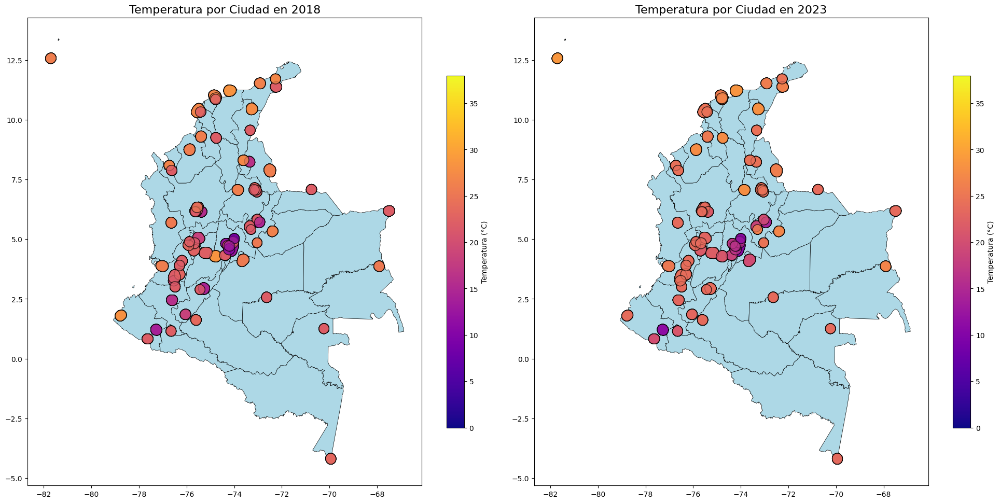

In [16]:

vias['distancia'] = abs(vias['distanciaf'] - vias['distanciai'])
vias_imp = vias[['distancia' , 'geometry']]
vias_imp = vias_imp.to_crs(epsg=4326)
base_geometry_buffered = base_geometry.copy()
base_geometry_buffered['geometry'] = base_geometry_buffered.geometry.buffer(0.2)

base_geometry_buffered['fecha'] = pd.to_datetime(base_geometry_buffered['Mes'], format='%Y-%m')
base_geometry_buffered['año'] = base_geometry_buffered['fecha'].dt.year
base_geometry_buffered['mes'] = base_geometry_buffered['fecha'].dt.month

base_geometry_buffered2018 = base_geometry_buffered[base_geometry_buffered['año'] == 2018]
base_geometry_buffered2023 = base_geometry_buffered[base_geometry_buffered['año'] == 2023]



fig, axes = plt.subplots(1, 2, figsize=(20, 10))
Departamentos.plot(ax=axes[0], color='lightblue', edgecolor='black', linewidth=0.5, label='Municipios')
base_geometry_buffered2018.plot(ax=axes[0], column='Temperatura', cmap='plasma', legend=True,legend_kwds={'label': "Temperatura (°C)", 'orientation': "vertical", 'shrink': 0.7},
    edgecolor='black', alpha=0.7, vmin=0, vmax=38)

axes[0].set_title('Temperatura por Ciudad en 2018', fontsize=16)
Departamentos.plot(ax=axes[1], color='lightblue', edgecolor='black', linewidth=0.5, label='Municipios')
base_geometry_buffered2023.plot(ax=axes[1], column='Temperatura', cmap='plasma', legend=True,legend_kwds={'label': "Temperatura (°C)", 'orientation': "vertical", 'shrink': 0.7},
    edgecolor='black', alpha=0.7, vmin=0, vmax=38)

axes[1].set_title('Temperatura por Ciudad en 2023', fontsize=16)

plt.tight_layout()
plt.show()

### Average Temperature Distribution by City (2018 vs. 2023)

The two maps plot each city’s mean annual temperature for **2018** (left) and **2023** (right), using both **color** (purple → yellow) and **marker size** to indicate thermal intensity.

- **Elevation Gradient Emerges Clearly:**  
  - **High-altitude Andean cities** (e.g., Bogotá, Tunja, Manizales) appear in cooler tones (≈ 10–15 °C), reflecting their mountainous climates.  
  - **Low-lying coastal and eastern cities** (e.g., Cartagena, Santa Marta, Puerto Carreño) show warmer hues (≈ 25–30 °C), consistent with tropical, near-sea-level conditions.

- **Spatial Consistency Over Time:**  
  - The geographic pattern of “cold” Andean cores and “hot” peripheries remains unchanged between 2018 and 2023, underscoring Colombia’s stable altitudinal climate zones.  
  - Marker sizes grow only marginally in 2023’s warmest cities, suggesting slight upward shifts in average temperatures—but no dramatic redefinition of thermal regions.

- **Subtle Warming Trend:**  
  - A faint drift toward warmer color bands in 2023—especially in mid-altitude cities like Medellín and Ibagué—may hint at broader warming influences (e.g., El Niño events or early climate-change signals).  
  - Quantifying these changes will require multi-decadal analysis, but the year-over-year comparison confirms that average temperatures are creeping upward even in historically cooler locales.

- **Implications for Tourism & Urban Planning:**  
  - **Tourism seasonality** could shift as formerly temperate highland destinations warm into more comfortable “shoulder-season” ranges—potentially extending visitor windows outside peak summer months.  
  - **Infrastructure adaptation** (e.g., improved cooling systems, green shading) may become increasingly important in both high-traffic coastal resorts and emerging mid-altitude markets.

In summary, these maps reaffirm Colombia’s dramatic temperature contrasts—driven by altitude—and reveal the first signs of a modest warming trend over a five-year span, with important consequences for both tourism strategy and urban resilience planning.  


C:\Users\alejo\AppData\Local\Temp\ipykernel_20636\2802109727.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ciudades_geom['geometry'] = ciudades_geom.geometry.buffer(0.16)


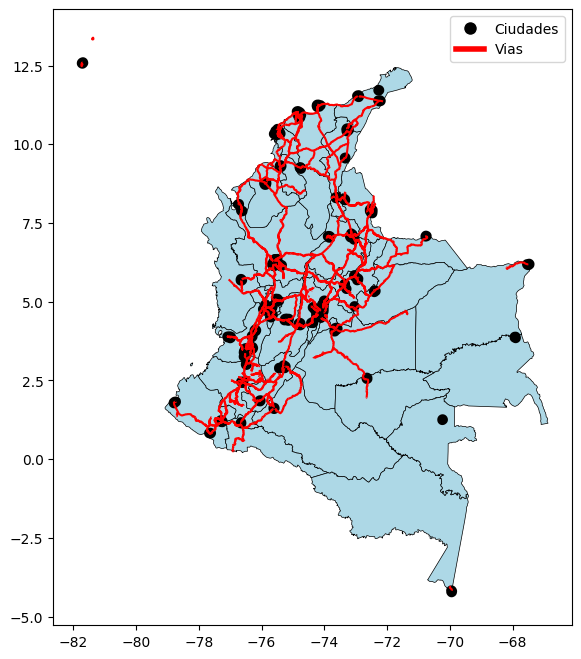

In [163]:
vias = gpd.read_file('C:\\Users\\alejo\\OneDrive\\Escritorio\\Universidaad\\Colab Notebooks\\Ia en economia\\Proyecto\\RedVial.zip')
vias['distancia'] = abs(vias['distanciaf'] - vias['distanciai'])
vias_imp = vias[['distancia' , 'geometry']]
ciudades_geom= gpd.read_file('C:\\Users\\alejo\\OneDrive\\Escritorio\\Universidaad\\Colab Notebooks\\Ia en economia\\Proyecto\\Ciudades Colombia Geometry.geojson')
ciudades_geom['geometry'] = ciudades_geom.geometry.buffer(0.16)

ciudades_geom = ciudades_geom.to_crs(epsg=4326)
vias_imp = vias_imp.to_crs(epsg=4326)

from matplotlib.lines import Line2D


fig, ax = plt.subplots(1, 1, figsize=(10, 8))
Departamentos.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.5)
ciudades_geom.plot(ax=ax, color='black', markersize=50)  
vias_imp.plot(ax=ax, color='red', edgecolor='black') 
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Ciudades',markerfacecolor='black', markersize=10),
    Line2D([0], [0], color='red', lw=4, label='Vias')]

ax.legend(handles=legend_elements, loc='upper right')
plt.show()

### Road Network & City Connectivity Map

This map overlays Colombia’s primary urban centers (black dots) on its terrestrial road network (red lines) against departmental borders (light blue).  

- **Andean & Central Hub Concentration:**  
  - The densest web of highways and major roads radiates across the Andean belt—from **Bogotá** through **Medellín** and down to **Cali**—reflecting these cities’ roles as economic and logistical nexuses.  
  - Secondary hubs like **Bucaramanga**, **Pereira**, and **Manizales** appear on highly branched segments, underscoring their integration into national transport corridors.

- **Peripheral Connectivity Gaps:**  
  - Eastern departments (Amazonas, Guaviare, Vichada), large swaths of the Orinoquía, and stretches of the Pacific coast (e.g., Tumaco) show sparse or missing road links.  
  - Limited terrestrial access in these regions corresponds to lower tourism and economic throughput, as surface travel times are longer and less reliable.

- **Implications for Tourism & Development:**  
  1. **Accessibility Drives Visitation:** Well-connected cities enjoy seamless inflows of tourists and goods. Enhancing road density around emerging destinations can directly boost visitor numbers by reducing travel friction.  
  2. **Targeted Infrastructure Investment:** Strategic bypasses, road upgrades, or new linkages—especially in mid-sized towns near natural attractions—can unlock latent tourism potential in under-served regions.  
  3. **Multimodal Integration:** In remote areas where road building is challenging, integrating river ports, airstrips, and feeder roads can create hybrid access routes that overcome connectivity barriers.  
  4. **Resilience & Equity:** A balanced network expansion ensures that economic and tourism benefits extend beyond the Andean core, fostering inclusive growth and reducing regional disparities.

By aligning future road-building and maintenance programs with tourism planning—prioritizing corridors that connect cultural, ecological, and adventure hotspots—Colombia can deepen its tourism footprint while strengthening national cohesion.  


## Pablo Reyes